In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import matplotlib.pyplot as plt
import numpy as np
import meshio
import tqdm
import pickle
import glob
import scipy as sp
import pickle
import re

import mph

In [3]:
client = mph.start()
# model_mph = client.load('./microreactor_val.mph')
# model_mph = client.load('../topo/microreactor_optimization1.mph')
# model_mph = client.load('./microreactor_optimization1.mph')
model_mph = client.load('./microreactor_val3.mph')

In [4]:
import pickle
import torch
import numpy as np
import torch.nn as nn
import dgl
import matplotlib.pyplot as plt
import os
from torch.utils.data.sampler import SubsetRandomSampler
from utils import get_seed, micro_obj, plot_input_output, micro_obj_batch
from args import get_args
from data_utils import get_dataset, get_model, get_loss_func, MIODataLoader, RefDataLoader
from train_geo import validate_epoch as valid_geo
from tqdm import tqdm
import time
from mmapy import mmasub, kktcheck


import argparse

c:\Program Files\Anaconda3\envs\rno_opt\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [5]:
# model_path = './data/checkpoints/micro2d_sens_30x40_all_RNO_vf_ST0.9_refdist0.5_0121_11_09_05.pt'
# model_path = './data/checkpoints/micro2d_sens_30x40_all_RNO_vf_ST0.9_refdist0.5_0125_09_09_46.pt'
model_path = './data/checkpoints/micro2d_sens_100x12_all_RNO_vf_ST0.9_refdist0.5_objSign_noreg_0125_08_55_17.pt'

result = torch.load(model_path, map_location='cpu')

args = result['args']
model_dict = result['model']
device = torch.device('cpu')

kwargs = {'pin_memory': False} if args.gpu else {}
get_seed(args.seed, printout=False)

train_dataset, test_dataset = get_dataset(args)
# test_sampler = SubsetRandomSampler(torch.arange(len(test_dataset)))
# test_loader = RefDataLoader(test_dataset, sampler=test_sampler, batch_size=1, drop_last=False)

model = get_model(args,)
model.load_state_dict(model_dict)
model.eval()

Load dataset finished 2.170332193374634
Training with 960 samples


c:\Program Files\Anaconda3\envs\rno_opt\Lib\site-packages\dgl\heterograph.py:92: DGLWarning: Recommend creating graphs by `dgl.graph(data)` instead of `dgl.DGLGraph(data)`.
  dgl_warning(


Target features are normalized using unit transformer
tensor([[1.2535e-01, 9.6229e-04, 3.9757e-07, 6.4800e-01]]) tensor([[1.0161e-01, 7.9722e-04, 1.9930e-04, 2.9618e-01]])
Input features are normalized using unit transformer
tensor([[4.9602, 1.5394, 0.2810]]) tensor([[3.2579, 0.8280, 0.3820]])
Load dataset finished 0.4167044162750244
Testing with 240 samples
Using Virtual Fourier
Using Virtual Fourier
Using Virtual Fourier


RNO(
  (trunk_mlp): MLP(
    (act): GELU(approximate='none')
    (linear_pre): Linear(in_features=4, out_features=128, bias=True)
    (linear_post): Linear(in_features=128, out_features=128, bias=True)
    (linears): ModuleList(
      (0-2): 3 x Linear(in_features=128, out_features=128, bias=True)
    )
  )
  (branch_mlps): ModuleList(
    (0-2): 3 x MLP(
      (act): GELU(approximate='none')
      (linear_pre): Linear(in_features=4, out_features=128, bias=True)
      (linear_post): Linear(in_features=128, out_features=128, bias=True)
      (linears): ModuleList(
        (0-2): 3 x Linear(in_features=128, out_features=128, bias=True)
      )
    )
  )
  (blocks): Sequential(
    (0): CrossAttentionBlock(
      (ln1): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
      (ln2_branch): ModuleList(
        (0): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
      )
      (ln2): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
      (ln3): LayerNorm((128,), eps=1e-05, ele

## Verify Objective Function

In [ ]:
# from utils import reg_theta, micro_obj
# xy = np.loadtxt('../topo/static_output.txt', skiprows=9)

# fig, axs = plt.subplots(1, 2, figsize=(15, 4))
# cs = axs[0].scatter(xy[:, 0], xy[:, 1], c=xy[:, -1],s=5)
# axs[0].set_title('Input Theta')
# fig.colorbar(cs, ax=axs[0])
# cs = axs[1].scatter(xy[:, 0], xy[:, 1], c=xy[:, -2], s=5)
# axs[1].set_title('Output Concentration')
# fig.colorbar(cs, ax=axs[1])

In [ ]:
# traj = np.loadtxt('../topo/traj.txt', skiprows=9)

# y_dim = 6
# n_step = (traj.shape[1] - 2) // y_dim
# X, Y = traj[:, :2], traj[:, 2:]
# domain_idx = ~np.isnan(Y[:, 5])
# X, Y = X[domain_idx], Y[domain_idx]
# for j in range(n_step):
#     Y_i = Y[:, j * y_dim : (1 + j) * y_dim]
#     X_i = np.concatenate([X, Y_i[:, 3, None]], axis=-1)
    
#     x = torch.from_numpy(X_i)
#     y = torch.from_numpy(Y_i[:, [0, 1, 2, 3, 5]])
#     print(micro_obj(x, y)) 

## Verify autograd

In [ ]:
# from utils import micro_obj_batch
# # Starts from normalized x
# x_norm = train_dataset.x_normalizer
# y_norm = train_dataset.y_normalizer

# g_ = dgl.DGLGraph()
# g_.add_nodes(g.ndata['x'].shape[0])
# g_.ndata['x'] = g.ndata['x'].detach().clone().float()
# g_.ndata['x'].requires_grad = True

# y_pred, y_ref = model([g_], [g_r], None, None)
# y_pred = torch.cat([y_pred, torch.zeros(len(y_pred), 1)], dim=-1)
# # Need to change J_ in micro_obj_batch to mean()
# dJdx = micro_obj_batch([g_], y_pred, x_norm, y_norm, create_graph=False, retain_graph=False)

In [ ]:
# # Starts from original x
# x_q = g.ndata['x'].detach().clone() # initial query
# x_orig = x_norm.transform(x_q, inverse=True)
# x_orig = x_orig.detach().clone()
# x_orig.requires_grad = True

# x_trans = x_norm.transform(x_orig, inverse=False)
# g_ = dgl.DGLGraph()
# g_.add_nodes(x_trans.shape[0])
# g_.ndata['x'] = x_trans

# y_pred, y_ref = model([g_], [g_r], None, None)
# y_pred = torch.cat([y_pred, torch.zeros(len(y_pred), 1)], dim=-1)
# y_pred_orig = y_norm.transform(y_pred, inverse=True)

# J = y_pred_orig[:, 3].mean(dim=0)
# dJdx = torch.autograd.grad(J, x_orig, create_graph=False, retain_graph=False)

## Optimize with RNO

In [6]:
def update_ref(x_new, params, model_mph):  
    '''COMSOL is calculated in original scale. 
    Input x_new should not be transformed.
    Output should be transformed to normalized scale.
    '''
    # Update update_input.txt
    # update_input_path = 'C:\\Users\\cee3sgh\\AppData\\Local\\Temp\\csjavabridge64479\\-f7593ki7ccau\\update_input.txt'
    input_dim = 3
    update_input_path = 'update_input.txt'
    np.savetxt(update_input_path, x_new[:, :input_dim].detach().cpu().numpy())
    # model_mph.java.component("comp1").func("int2").discardData()
    # model_mph.java.component("comp1").func("int2").set("filename", update_input_path)
    # model_mph.java.component("comp1").func("int2").importData()
    model_mph.java.func("int3").discardData()
    model_mph.java.func("int3").set("filename", update_input_path)
    model_mph.java.func("int3").importData()
    print('Update reference input.')
    
    start_time = time.time()
    # solve model
    # model_mph.mesh()
    model_mph.solve('Study 2') # use model_mph.studies() to check study names
    end_time = time.time()

    # output model    
    print(f'Update reference output in {(end_time - start_time):.2f} seconds.')
    model_mph.java.result().export("data2").set("filename", "update_output.txt")
    model_mph.java.result().export("data2").run()
    model_mph.java.result().export("data3").set("filename", "update_objective.txt")
    model_mph.java.result().export("data3").run()
    
    # Read updated output
    output = np.loadtxt('update_output.txt', skiprows=9) # 2: space_dim, 4: out_dim, 1: input_dim
    # domain_idx = ~np.isnan(output[:, 2+5-1])
    domain_idx = x_new[:, -1].bool()
    assert len(np.isnan(output[:, 6])) == len(np.isnan(output[:, 7]))
    # y_ = output[domain_idx, 2:] # Crop y outside of active domain
    y_ = np.nan_to_num(output[:, 2:]) # Fill all NaN values of sensitivity with 0's
    # print(x_new.shape, output.shape)
    assert len(x_new) == len(output)
    
    # Read obj
    obj = np.loadtxt('update_objective.txt', skiprows=9)
    print(f'Updated objective={obj[0, -1]:.5f}')
    
    fig, axs = plt.subplots(1, 4, figsize=(24,4))
    # cs = axs[0].scatter(output[domain_idx, 0], output[domain_idx, 1], c=output[domain_idx, -1]) # Sensitivity
    cs = axs[0].tricontourf(output[domain_idx, 0], output[domain_idx, 1], x_new[domain_idx, 2].detach(), levels=100, cmap='viridis') # Theta
    fig.colorbar(cs, ax=axs[0])
    axs[0].set_title('Input Theta')
    cs = axs[1].tricontourf(output[domain_idx, 0], output[domain_idx, 1], y_[domain_idx, 1], levels=100, cmap='RdBu_r') # U
    fig.colorbar(cs, ax=axs[1])
    axs[1].set_title('Output U')
    cs = axs[2].tricontourf(output[domain_idx, 0], output[domain_idx, 1], y_[domain_idx, 3], levels=100, cmap='RdBu_r') # Concentration
    # cs = axs[2].scatter(output[domain_idx, 0], output[domain_idx, 1], c=output[domain_idx, 6]) # Theta
    fig.colorbar(cs, ax=axs[2])
    axs[2].set_title('Output Concentration')
    cs = axs[3].tricontourf(output[domain_idx, 0], output[domain_idx, 1], y_[domain_idx, -1], levels=100, cmap='RdBu_r') # sensitivity
    fig.colorbar(cs, ax=axs[3])
    axs[3].set_title('Sensitivity')
    plt.show()
    # print(f'Number of points in active area={len(output[domain_idx])}.')
    # print('Difference between x_gt and x_orig: ', sum(abs(x_new[domain_idx, 2].detach().numpy() - output[domain_idx, -2])))

    # # If for some reason COMSOL would change 
    # # the number of mesh nodes for the same geometry,
    # # we interpolate the results on original grids
    # if len(x_new) != len(x_):
    #     print(f'Mesh numbers {(len(x_), len(x_new))} do not match. Interpolation is applied.')
    #     # interp = sp.interpolate.LinearNDInterpolator
    #     interp = sp.interpolate.NearestNDInterpolator
    #     interpolator = interp(x_, y_)
    #     y_ = interpolator(x_new[:, :2])

    y_ = torch.from_numpy(y_)
    # y_ = torch.cat([y_[:, :-1], torch.zeros((len(y_), 1))], dim=-1) # remove theta and pad zero to y in the last dim
    y_ = y_[:, [0, 1, 2, 3, 5]] # remove theta
    assert not y_.isnan().any()
    y_r_ = y_norm.transform(y_, inverse=False)
    x_r_ = x_norm.transform(x_new, inverse=False)
    g_ = dgl.DGLGraph()
    g_.add_nodes(x_r_.shape[0])
    g_.ndata['x'] = x_r_.detach().clone().float()
    g_.ndata['y'] = y_r_.float()
    
    return [g_]

def gradient_pertub(x_orig, g_r_, num_pertub, model, drop_ref=False):
    '''Original space: x_orig, J, dx
        Transformed space: g_r_, y_pred, y_ref, x_trans
    '''
    theta_dim = 2
    # Starting without reference
    no_ref = 2 if drop_ref else 0     

    model.eval()
    x_trans = x_norm.transform(x_orig, inverse=False)
    domain = x_trans[:, theta_dim+1, None].detach().clone()
    # Perturb x_q a number of times and get the estimation of dJ / dx
    ys, gs = [], []
    for j in range(num_pertub):       
        x_q_pert = x_trans.clone()
        x_q_pert[:, theta_dim] += torch.randn(x_trans[:, theta_dim].shape) * noise
        
        g_ = dgl.DGLGraph()
        g_.add_nodes(x_q_pert.shape[0])
        g_.ndata['x'] = x_q_pert
        gs += [g_]
        y_pred, y_ref = model([g_], g_r_, None, None, no_ref=no_ref)
        y_pred = torch.cat([y_pred, torch.zeros(len(y_pred), 1)], dim=-1)
        ys.append(y_pred)
    y = torch.cat(ys, dim=0)
    dJdx = micro_obj_batch(gs, y, x_norm, y_norm, create_graph=False, retain_graph=False)
    assert len(dJdx) == len(gs)
    dx = torch.stack(dJdx, dim=0).mean(dim=0)
    dx = dx * domain # crop the sensitivity to active domain
    y_pred_orig = y_norm.transform(torch.stack(ys, dim=0).mean(dim=0), inverse=True)
    _, J = micro_obj(x_orig, y_pred_orig)
    y_pred_orig[:, -1] = dx.view(-1)

    return dx, y_pred_orig, J

def update_GD(x_orig, dx, i, rad_ref, alpha=1000):
    '''Perform gradient descent.'''
    theta_dim = 2
    iter_ratio = i / opt_iter
    # alpha = (rad_ref / dx.detach().abs().mean() + 1e-8) / anchor_step
    # alpha = 1 / anchor_step
    # alpha = max(alpha, 300)
    # alpha = alpha * (min(2 - iter_ratio, 1) + 1e-2)
    
    # print(f'Iter {i}: J={J.item()}, dist_gt={dist_gt.item()}, alpha={alpha}')
    x_new = x_orig.detach().clone()
    x_new[:, theta_dim] = x_new[:, theta_dim] + alpha * dx.squeeze() # maximize objective
    x_new[:, theta_dim] = torch.clamp(x_new[:, theta_dim], min=theta_min, max=theta_max) 

    return x_new


def update_MMA(x_old, x1, x2, outeriter, xmin, xmax, dx, J):
    '''Given gradient dx wrt J, MMA will minimize J.'''
    theta_dim = 2
    xval = (x_old.detach().numpy())[:, theta_dim, None] # xval, x1, x2 all have shape (N, 1)

    m, n = 1, len(xval)
    a0, a, c, d = 1, np.zeros((m, 1)), 10000 * np.ones((m, 1)), np.zeros((m, 1))
    move = 0.2
    f0val, df0dx = J.item(), (dx.detach().numpy())
    fval, dfdx = np.zeros((m, 1)), np.zeros_like(df0dx).T
    xmin, xmax = xmin * np.ones_like(df0dx), xmax * np.ones_like(df0dx)
    low, upp = xmin * np.ones_like(df0dx), xmax * np.ones_like(df0dx)
    # print('xval.shape, xmin.shape, xmax.shape, xold1.shape, xold2.shape', xval.shape, xmin.shape, xmax.shape, xold1.shape, xold2.shape)
    # print('df0dx.shape, fval.shape, dfdx.shape, low.shape, upp.shape', df0dx.shape, fval.shape, dfdx.shape, low.shape, upp.shape)

    # The MMA subproblem is solved at the point xval:
    xmma, ymma, zmma, lam, xsi, eta, mu, zet, s, low, upp = mmasub(
        m, n, outeriter, xval, xmin, xmax, x1, x2, f0val, df0dx, fval, dfdx, low, upp, a0, a, c, d, move)    
    
    
    # Some vectors are updated:
    x2 = x1.copy()
    x1 = xval.copy()
    xval = xmma.copy()
    
    x_new = x_old.detach().clone()
    x_new[:, theta_dim] = torch.from_numpy(xval).float().squeeze()
    return x_new, x1, x2

def multi_history(x_orig, g_r_buffer, num_pertub, model, drop_ref=False):
    dxs, ys, Js = [], [], []
    theta_dim = 2
    for g_r in g_r_buffer:
        dx, y_pred_orig, J = gradient_pertub(x_orig, [g_r], num_pertub, model, drop_ref)
        dxs.append(dx.detach().clone())
        ys.append(y_pred_orig.detach().clone())
        Js.append(J.detach().clone())
    dxs, ys, Js = torch.stack(dxs), torch.stack(ys), torch.stack(Js)
    # print(f'std of J={Js.std(dim=0).detach().item()}')
    print(f'std of dx={dxs.std(dim=0).mean(dim=0).detach().item()}, length of dxs ={len(dxs)}')

    return dxs.mean(dim=0), ys.mean(dim=0), Js.mean(dim=0)

def relp_dist(q, r, p=2):
    error = r - q
    rel_dist = ((error.abs()**p).sum(dim=0) / (q.abs()**p).sum(dim=0)) ** (1/p)
    assert ~rel_dist.isnan().any()
    return rel_dist.mean()


def gaussian_filter_sensitivity(sensitivities, design_variables, filter_radius, sigma):
    """
    Performs Gaussian filtering on sensitivities.

    Args:
    sensitivities: Array of sensitivities.
    design_variables: Array of design variables (used to calculate distances).
    filter_radius: Radius of the filter.
    sigma: Standard deviation for the Gaussian function.

    Returns:
    Filtered sensitivities.
    """
    spatial_dim = 2
    domain_idx = design_variables[:, -1].bool()
    domain_x = design_variables[domain_idx, :spatial_dim]
    filtered_sensitivities = torch.zeros_like(sensitivities)

    # Calculate the distance matrix between design variables
    distance_matrix = torch.cdist(domain_x, domain_x)

    # Create a weight matrix based on the filter radius
    weight_matrix = torch.exp(-(distance_matrix / sigma)**2)
    weight_matrix[distance_matrix > filter_radius] = 0

    # Normalize the weight matrix
    weight_matrix /= torch.sum(weight_matrix, dim=1, keepdim=True)

    # Calculate the filtered sensitivities
    filtered_sensitivities[domain_idx] = torch.mm(weight_matrix, sensitivities[domain_idx])

    return filtered_sensitivities

def plot_fig(x, y, levels=50):
    domain_idx = x[:, -1].bool()

    fig, axs = plt.subplots(1, 6, figsize=(36,4))
    # cs = axs[0].scatter(output[domain_idx, 0], output[domain_idx, 1], c=output[domain_idx, -1]) # Sensitivity
    cs = axs[0].tricontourf(x[domain_idx, 0], x[domain_idx, 1], x[domain_idx, 2].detach(), levels=levels, cmap='viridis') # Theta
    fig.colorbar(cs, ax=axs[0])
    axs[0].set_title('Input Theta')
    cs = axs[1].tricontourf(x[domain_idx, 0], x[domain_idx, 1], y[domain_idx, 0], levels=levels, cmap='RdBu_r') # P
    fig.colorbar(cs, ax=axs[1])
    axs[1].set_title('Output P')
    cs = axs[2].tricontourf(x[domain_idx, 0], x[domain_idx, 1], y[domain_idx, 1], levels=levels, cmap='RdBu_r') # U
    fig.colorbar(cs, ax=axs[2])
    axs[2].set_title('Output U')
    cs = axs[3].tricontourf(x[domain_idx, 0], x[domain_idx, 1], y[domain_idx, 2], levels=levels, cmap='RdBu_r') # V
    fig.colorbar(cs, ax=axs[3])
    axs[3].set_title('Output V')
    cs = axs[4].tricontourf(x[domain_idx, 0], x[domain_idx, 1], y[domain_idx, 3], levels=levels, cmap='RdBu_r') # Concentration
    fig.colorbar(cs, ax=axs[4])
    axs[4].set_title('Output Concentration')
    cs = axs[5].tricontourf(x[domain_idx, 0], x[domain_idx, 1], y[domain_idx, 4], levels=levels, cmap='RdBu_r') # Sensitivity
    fig.colorbar(cs, ax=axs[5])
    axs[5].set_title('Sensitivity')
    fig.savefig(fig_path+f'/{i}.svg')

In [ ]:
#  def plot_fig(x_orig):
#     fig, ax = plt.subplots()
#     domain_idx = x_orig[:, -1].bool()
#     cs = plt.tricontourf(x_orig[domain_idx, 0].detach(), x_orig[domain_idx, 1].detach(), x_orig[domain_idx, 2].detach(), levels=100, cmap='viridis') # Theta
#     fig.colorbar(cs, ax=ax)
#     ax.set_title('Input Theta')

# plot_fig(x_orig)

In [ ]:
# sensitivities = torch.rand(100, 1)  # Example sensitivities
# design_variables = torch.rand(100, 2)  # Example design variables (2D)
# filter_radius = 0.5
# sigma = 0.1

# filtered_sensitivities = gaussian_filter_sensitivity(sensitivities, design_variables, filter_radius, sigma) 

# plt.scatter(design_variables[:, 0], design_variables[:, 1], c=sensitivities)
# plt.show()
# plt.scatter(design_variables[:, 0], design_variables[:, 1], c=filtered_sensitivities)
# plt.show()

In [24]:
n_step = args.n_step
idx_traj = 0 # trajectory idx
start_step = 0
q_init = n_step * idx_traj + start_step
# r_init = q_init
g = test_dataset[q_init][0]  # optimiztion initial design
# g_r = test_dataset[r_init][0] # initial reference
# g = train_dataset[q_init][0]  # optimiztion initial design
# g_r = train_dataset[r_init][0] # initial reference
g_r = dgl.DGLGraph() # The dummy initial reference that will be dropped
g_r.add_nodes(g.ndata['x'].shape[0])
g_r.ndata['x'] = torch.zeros_like(g.ndata['x'])
g_r.ndata['y'] = torch.zeros_like(g.ndata['y'])

# Find parameter of query
data = '100x7'
params_file = np.load(f'./params_list_microreactor_{data}.npy', allow_pickle=True).item()
# q_idx = params_file['test'][idx_traj]  # turn off if not using train-test split
# q_idx = params_file['train'][idx_traj]  
# train 0~23, test 24~29
# q_idx = 24 + idx_traj
q_idx = 80 + idx_traj
q_params = params_file['params'][q_idx]

# # set params
# for p, v in q_params.items():
#     model_mph.parameter(p, str(v))
# # print(model_mph.parameters())        
# model_mph.geometries()
# model_mph.build()


c:\Program Files\Anaconda3\envs\rno_opt\Lib\site-packages\dgl\heterograph.py:92: DGLWarning: Recommend creating graphs by `dgl.graph(data)` instead of `dgl.DGLGraph(data)`.
  dgl_warning(


In [25]:
########################### Gradient Descent Optimization ###########################
alpha = 1e3 # update weight
opt_iter = 300 # Optimization iterations
num_pertub = 1
noise = 0.0
log_steps = 5
rad_gt = 4e-1 # the radius to update ref by re-caculating ground truth solution
# rad_soft = 2e-2 # the radius to update ref with model prediction
filter_radius, sigma = 0.3, 0.06 # sensitivity filtering
theta_dim = 2
regularizing = False
model.eval()

# Inverse transform
x_norm = train_dataset.x_normalizer
y_norm = train_dataset.y_normalizer
use_MMA = True
x_q = g.ndata['x'].detach().clone() # initial query
# g_r_curr = [g_r] # The current reference
g_r_buffer = [g_r]

x_orig = x_norm.transform(x_q, inverse=True)
x_orig = x_orig.detach().clone()
x_r_orig = x_orig.detach().clone()
x_orig.requires_grad = True
x_gt, y_gt = None, None
if use_MMA:
    xold1 = (x_orig.detach().numpy())[:, theta_dim, None]
    xold2 = (x_orig.detach().numpy())[:, theta_dim, None]

theta_max, theta_min = 1, 0
# mu, sig = x_norm.mean[0][-1], x_norm.std[0][-1]
# theta_max = (theta_max - mu) / sig
# theta_min = (theta_min - mu) / sig

gt_idx = 0
i_pre = 0 # The previous step of updating GT reference
i_pre_sf = 0 # The previous step of updating soft reference
check_step = 100 # The min steps between GT updates 
warm_up = 20
buffer_size = 5 # The size of reference buffer
buffer_step = 2
mma_scale_J = 1000
mma_scale_x = 1
obj_track = []

fig_path = 'fig/' + train_dataset.name +f'_traj{idx_traj}_' +f'q{q_init}_' \
            + f'noise{noise}_' + f'rad{rad_gt}_' + f'os{mma_scale_J}' + time.strftime('_%m%d_%H_%M_%S') 
# data_path = './data_gen/' + f'traj{idx_traj}_'


In [26]:
def compute_params(x_orig):
    x_orig = x_orig.detach()
    domain_idx = x_orig[:, -1].bool()
    x = x_orig[domain_idx]
    w = (x[:, 0].max() - x[:, 0].min()).numpy()
    h = (x[:, 1].max() - x[:, 1].min()).numpy()
    x1 = x_orig[~domain_idx]
    y_in = x1[x1[:, 0] < x1[:, 0].mean(), 1].min().numpy()
    y_out = x1[x1[:, 0] > x1[:, 0].mean(), 1].min().numpy()
    # print(w, h, y_in, y_out)

    return np.round(w, 1), np.round(h, 1), np.round(y_in, 1), np.round(y_out, 1)


# If the parameter doesn't correspond to data, compute the params
q_params['w_r'], q_params['h_r'], q_params['y_in'], q_params['y_out'] = compute_params(x_orig)

# set params
for p, v in q_params.items():
    model_mph.parameter(p, str(v))
# print(model_mph.parameters())        
model_mph.geometries()
model_mph.build()

C:\Users\cee3sgh\AppData\Local\Temp\ipykernel_17504\1528009123.py:179: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1760.)
  print(f'std of dx={dxs.std(dim=0).mean(dim=0).detach().item()}, length of dxs ={len(dxs)}')


std of dx=nan, length of dxs =1
buffer length=1
Iter 0: J=0.05827721208333969, dist_gt=0.0, dist_q_r=0.0
std of dx=nan, length of dxs =1
buffer length=1
Iter 1: J=0.04350440204143524, dist_gt=0.0, dist_q_r=0.012788807973265648
std of dx=nan, length of dxs =1
buffer length=2
Iter 2: J=0.0420491099357605, dist_gt=0.0, dist_q_r=0.021096784621477127
std of dx=5.941481049376307e-06, length of dxs =2
buffer length=2
Iter 3: J=0.03731793165206909, dist_gt=0.0, dist_q_r=0.026592085137963295
std of dx=7.526186891482212e-06, length of dxs =2
buffer length=3
Iter 4: J=0.03622913360595703, dist_gt=0.0, dist_q_r=0.0331517793238163
std of dx=7.80625850893557e-06, length of dxs =3
buffer length=3
Iter 5: J=0.03374847397208214, dist_gt=0.0, dist_q_r=0.036857228726148605
std of dx=8.42804820422316e-06, length of dxs =3
buffer length=4
Iter 6: J=0.03293938562273979, dist_gt=0.0, dist_q_r=0.04122656583786011
std of dx=8.157249794749077e-06, length of dxs =4
buffer length=4
Iter 7: J=0.031316038221120834,

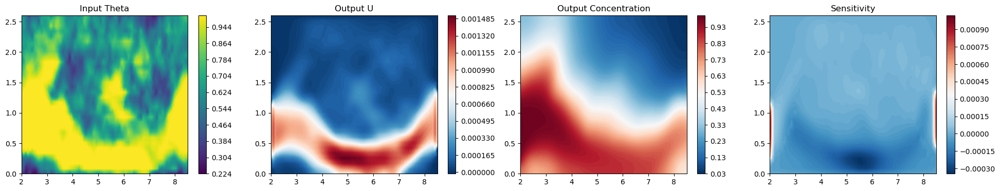

std of dx=3.1480119560001185e-06, length of dxs =5
buffer length=5
Iter 20: J=0.021960867568850517, dist_gt=0.0, dist_q_r=0.030393028631806374
std of dx=3.1670613225287525e-06, length of dxs =5
buffer length=5
Iter 21: J=0.021831240504980087, dist_gt=0.39762479066848755, dist_q_r=0.03256983682513237
std of dx=3.177496864736895e-06, length of dxs =5
buffer length=5
Iter 22: J=0.021737083792686462, dist_gt=0.3945429027080536, dist_q_r=0.034297116100788116
std of dx=3.3068911307054805e-06, length of dxs =5
buffer length=5
Iter 23: J=0.021531661972403526, dist_gt=0.39210832118988037, dist_q_r=0.035687487572431564
std of dx=3.340732291690074e-06, length of dxs =5
buffer length=5
Iter 24: J=0.021430036053061485, dist_gt=0.3888368606567383, dist_q_r=0.03784735128283501
std of dx=3.39905727742007e-06, length of dxs =5
buffer length=5
Iter 25: J=0.021466543897986412, dist_gt=0.38675105571746826, dist_q_r=0.026381036266684532
std of dx=3.4348067856626585e-06, length of dxs =5
buffer length=5
Ite

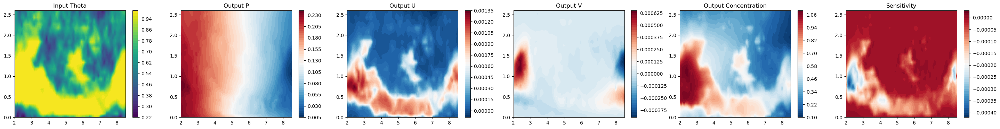

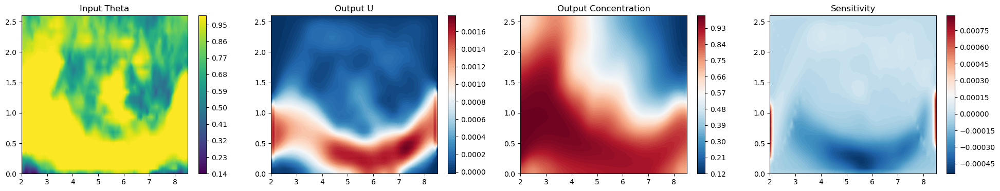

std of dx=3.532082246238133e-06, length of dxs =5
buffer length=5
Iter 40: J=0.02086983062326908, dist_gt=0.4518752098083496, dist_q_r=0.022394198924303055
std of dx=3.4254694583069067e-06, length of dxs =5
buffer length=5
Iter 41: J=0.020767085254192352, dist_gt=0.3861502707004547, dist_q_r=0.02439102530479431
std of dx=3.272553385613719e-06, length of dxs =5
buffer length=5
Iter 42: J=0.020671656355261803, dist_gt=0.3862018585205078, dist_q_r=0.02624679170548916
std of dx=4.090632955922047e-06, length of dxs =5
buffer length=5
Iter 43: J=0.02077939175069332, dist_gt=0.38692328333854675, dist_q_r=0.02807219699025154
std of dx=3.894938799930969e-06, length of dxs =5
buffer length=5
Iter 44: J=0.020664673298597336, dist_gt=0.3939894735813141, dist_q_r=0.030017567798495293
std of dx=4.360268576419912e-06, length of dxs =5
buffer length=5
Iter 45: J=0.020778972655534744, dist_gt=0.39665377140045166, dist_q_r=0.022822434082627296
std of dx=4.1126108953903895e-06, length of dxs =5
buffer le

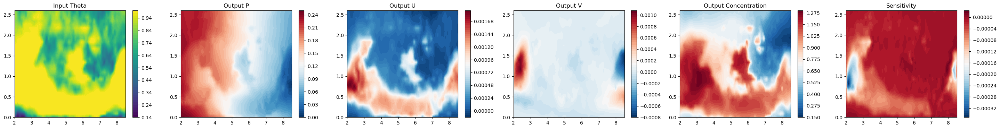

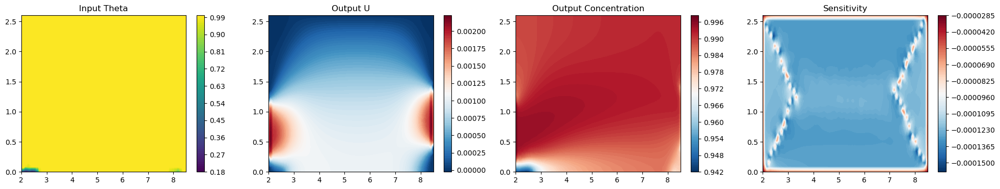

std of dx=5.085099928692216e-06, length of dxs =5
buffer length=5
Iter 60: J=0.0008356979233212769, dist_gt=0.7315834164619446, dist_q_r=0.03667978569865227
std of dx=5.050031177233905e-06, length of dxs =5
buffer length=5
Iter 61: J=0.0006981558981351554, dist_gt=0.48659390211105347, dist_q_r=0.03689940273761749
std of dx=5.025875907449517e-06, length of dxs =5
buffer length=5
Iter 62: J=0.0006050043739378452, dist_gt=0.4867132604122162, dist_q_r=0.03705807775259018
std of dx=4.285105660528643e-06, length of dxs =5
buffer length=5
Iter 63: J=0.0005127618787810206, dist_gt=0.48634934425354004, dist_q_r=0.03721094876527786
std of dx=4.276765594113385e-06, length of dxs =5
buffer length=5
Iter 64: J=0.0003987001837231219, dist_gt=0.5096485614776611, dist_q_r=0.03737831488251686
std of dx=2.5146321149804862e-06, length of dxs =5
buffer length=5
Iter 65: J=0.00027041262364946306, dist_gt=0.5091263651847839, dist_q_r=0.011437233537435532
std of dx=2.508993247829494e-06, length of dxs =5
buf

C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.10735e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=8.47552e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=9.92198e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.19014e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.39312e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Py

Iter 69: J=2.0289766666792275e-07, dist_gt=0.5731393694877625, dist_q_r=0.01178316492587328
std of dx=7.806897315276728e-07, length of dxs =5
buffer length=5


C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.09964e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=8.40827e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=9.78665e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.17284e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.37242e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Py

Iter 70: J=2.2221664153221354e-07, dist_gt=0.6097794771194458, dist_q_r=0.0020081494003534317
std of dx=6.741854576830519e-07, length of dxs =5
buffer length=5


C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.09259e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=8.34508e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=9.66362e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.1572e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.35378e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Pyt

Iter 71: J=2.2055792214814574e-07, dist_gt=0.6097830533981323, dist_q_r=0.00201109959743917
std of dx=6.741840934409993e-07, length of dxs =5
buffer length=5


C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.08556e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=8.28871e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=9.55754e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.14366e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.33756e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Py

Iter 72: J=2.063239463723221e-07, dist_gt=0.649441123008728, dist_q_r=0.0020137459505349398
std of dx=6.731471557941404e-07, length of dxs =5
buffer length=5


C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.08089e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=9.73085e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.00664e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.14368e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.54356e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Py

Iter 73: J=2.0504811004684598e-07, dist_gt=0.6494447588920593, dist_q_r=0.0020164025481790304
std of dx=6.731448252139671e-07, length of dxs =5
buffer length=5


C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.07411e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=9.66837e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=9.97449e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.13101e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.52369e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Py

Iter 74: J=2.0619461338355904e-07, dist_gt=0.6924214959144592, dist_q_r=0.0020190528593957424
std of dx=6.593310217795079e-07, length of dxs =5
buffer length=5


C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.06797e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=9.60883e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=9.88638e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.11887e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.50478e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Py

Iter 75: J=2.0490026031438902e-07, dist_gt=0.6924253702163696, dist_q_r=0.00020741148910019547
std of dx=6.593255648112972e-07, length of dxs =5
buffer length=5


C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.06133e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=9.54804e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=9.7978e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.10669e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.48569e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Pyt

Iter 76: J=2.0599198080617498e-07, dist_gt=0.7387381792068481, dist_q_r=0.00021004707377869636
std of dx=6.383697837009095e-07, length of dxs =5
buffer length=5


C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.05532e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=9.49011e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=9.71283e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.09503e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.46752e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Py

Iter 77: J=2.047281526529332e-07, dist_gt=0.7387422919273376, dist_q_r=0.00021267367992550135
std of dx=6.383629624906462e-07, length of dxs =5
buffer length=5


C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.04882e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=9.43094e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=9.6274e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.08332e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.44918e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Pyt

Iter 78: J=2.0569545711168757e-07, dist_gt=0.7878572344779968, dist_q_r=0.00021529449441004544
std of dx=6.159773420222336e-07, length of dxs =5
buffer length=5


C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.0429e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=9.37443e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=9.54531e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.07208e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.43169e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Pyt

Iter 79: J=2.0452065996323654e-07, dist_gt=0.787861704826355, dist_q_r=0.00021790657774545252
Update GT reference.
Update reference input.
Update reference output in 32.13 seconds.
Updated objective=0.00134


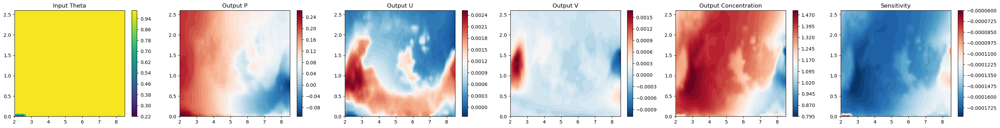

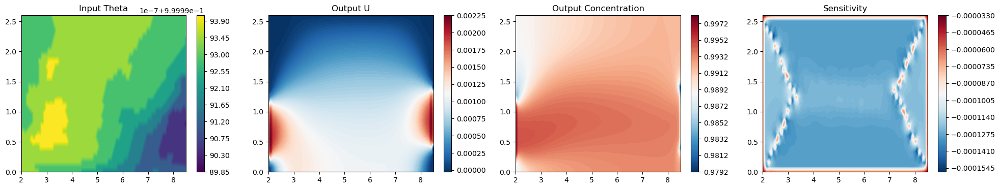

std of dx=6.159707481856458e-07, length of dxs =5
buffer length=5


C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.03653e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=9.31683e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=9.46288e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.06082e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.41405e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Py

Iter 80: J=2.0529701316718274e-07, dist_gt=0.8398418426513672, dist_q_r=2.6665136829251423e-05
std of dx=6.159646090964088e-07, length of dxs =5
buffer length=5


C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.03023e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=9.26003e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=9.38204e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.0498e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.39681e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Pyt

Iter 81: J=2.0529770949906379e-07, dist_gt=0.8543950319290161, dist_q_r=2.926307024608832e-05
std of dx=6.159560825835797e-07, length of dxs =5
buffer length=5


C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.02399e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=9.20396e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=9.30259e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.03898e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.37989e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Py

Iter 82: J=2.0529842004179955e-07, dist_gt=0.8543998003005981, dist_q_r=3.185406239936128e-05
std of dx=5.784719405710348e-07, length of dxs =5
buffer length=5


C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.01829e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=9.15029e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=9.22597e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.02856e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.36369e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Py

Iter 83: J=2.0420149837718782e-07, dist_gt=0.8544045090675354, dist_q_r=3.4438158763805404e-05
std of dx=5.784672225672693e-07, length of dxs =5
buffer length=5


C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.01219e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=9.09562e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=9.14903e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.01811e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.34736e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Py

Iter 84: J=2.0506283249233093e-07, dist_gt=0.9101049900054932, dist_q_r=3.701428067870438e-05
std of dx=5.395967264121282e-07, length of dxs =5
buffer length=5


C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.60952e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.07353e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=5.33448e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.28708e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=7.65862e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Py

Iter 85: J=2.0406505996106716e-07, dist_gt=0.9101099371910095, dist_q_r=2.866965405701194e-05
std of dx=5.39591894721525e-07, length of dxs =5
buffer length=5


C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.59955e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.0676e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=5.26255e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.8194e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=5.6051e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Pytho

Iter 86: J=2.050179261914309e-07, dist_gt=0.9700866937637329, dist_q_r=3.122790440102108e-05
std of dx=5.060375087850844e-07, length of dxs =5
buffer length=5


C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.59031e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.06184e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=5.19217e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.79811e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=5.54021e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Py

Iter 87: J=2.0411781065377e-07, dist_gt=0.9700919389724731, dist_q_r=3.378494147909805e-05
std of dx=5.060344960838847e-07, length of dxs =5
buffer length=5


C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.58052e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.05603e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=5.1234e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.77661e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=5.47464e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Pyt

Iter 88: J=2.05403082986777e-07, dist_gt=1.035301685333252, dist_q_r=3.6337751225801185e-05
std of dx=4.778244147018995e-07, length of dxs =5
buffer length=5


C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.57142e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.0504e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=5.05641e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.75604e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=5.41192e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Pyt

Iter 89: J=2.0458169558423833e-07, dist_gt=1.0353071689605713, dist_q_r=3.8881695218151435e-05
std of dx=4.778222546519828e-07, length of dxs =5
buffer length=5


C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.56183e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.04474e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=4.99104e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.73531e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=5.34873e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Py

Iter 90: J=2.0551256341150292e-07, dist_gt=1.1070129871368408, dist_q_r=3.089399615419097e-05
std of dx=4.5114896352060896e-07, length of dxs =5
buffer length=5


C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.55289e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.03924e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=4.92723e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.71544e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=5.28813e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Py

Iter 91: J=2.047603118171537e-07, dist_gt=1.1070184707641602, dist_q_r=3.3424988941987976e-05
std of dx=4.511473434831714e-07, length of dxs =5
buffer length=5


C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.5435e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.03371e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=4.86497e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.69545e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=5.22717e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Pyt

Iter 92: J=2.0548546331156103e-07, dist_gt=1.1869268417358398, dist_q_r=3.595105590648018e-05
std of dx=4.2681335798988584e-07, length of dxs =5
buffer length=5


C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.53471e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.02834e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=4.80413e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.67625e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=5.16861e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Py

Iter 93: J=2.0479060935940652e-07, dist_gt=1.1869323253631592, dist_q_r=3.846943218377419e-05
std of dx=4.2681290324253496e-07, length of dxs =5
buffer length=5


C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.5255e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.02294e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=4.74476e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.65696e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=5.10977e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Pyt

Iter 94: J=2.053501759746723e-07, dist_gt=1.2772685289382935, dist_q_r=4.098259159945883e-05
std of dx=4.060639184899628e-07, length of dxs =5
buffer length=5


C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.51688e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.01769e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=4.6867e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.63842e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=5.0532e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Pyth

Iter 95: J=2.0469619244067871e-07, dist_gt=1.277274250984192, dist_q_r=2.2785377950640395e-05
std of dx=4.060649416715023e-07, length of dxs =5
buffer length=5


C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.50786e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.01242e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=4.63002e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.61979e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=4.99636e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Py

Iter 96: J=2.0523165744634753e-07, dist_gt=1.3807979822158813, dist_q_r=2.528624827391468e-05
std of dx=3.899536409335269e-07, length of dxs =5
buffer length=5


C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.4994e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.0073e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=7.00358e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=7.48089e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=8.074e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python

Iter 97: J=2.0459776806092123e-07, dist_gt=1.3808037042617798, dist_q_r=2.77799554169178e-05
std of dx=3.8995489148874185e-07, length of dxs =5
buffer length=5


C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.49056e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.00214e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=6.94541e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=7.41282e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=7.9957e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Pyt

Iter 98: J=2.0526003652321378e-07, dist_gt=1.5010212659835815, dist_q_r=3.0269246053649113e-05
std of dx=3.799681849159242e-07, length of dxs =5
buffer length=5


C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.4751e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=9.9231e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=6.82026e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=7.26503e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=7.82502e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Pyth

Iter 99: J=2.7567216420720797e-07, dist_gt=1.50102698802948, dist_q_r=3.505445420159958e-05
Update GT reference.
Update reference input.
Update reference output in 32.01 seconds.
Updated objective=0.00134


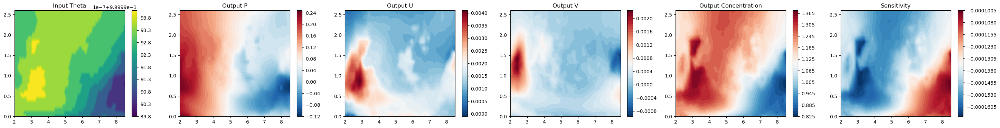

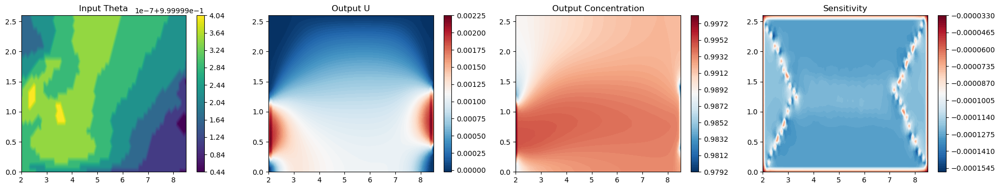

std of dx=3.7997159552105586e-07, length of dxs =5
buffer length=5


C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.46633e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=9.87727e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=6.78359e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=7.22385e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=7.77871e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Py

Iter 100: J=2.0535003386612516e-07, dist_gt=1.6423739194869995, dist_q_r=2.7225440135225654e-05
std of dx=3.7997224922037276e-07, length of dxs =5
buffer length=5


C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.45748e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=9.82745e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=6.72941e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=7.16046e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=7.70568e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Py

Iter 101: J=2.0535080125227978e-07, dist_gt=1.6419216394424438, dist_q_r=2.9690372684854083e-05
std of dx=3.799747219090932e-07, length of dxs =5
buffer length=5


C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.44906e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=9.7788e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=6.67626e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=7.61973e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=8.96914e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Pyt

Iter 102: J=2.0535155442757969e-07, dist_gt=1.6419271230697632, dist_q_r=3.214507523807697e-05
std of dx=3.835405379959411e-07, length of dxs =5
buffer length=5


C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.4412e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=9.73143e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=6.62409e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=7.54891e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=3.00051e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Pyt

Iter 103: J=2.0469242656417919e-07, dist_gt=1.641932725906372, dist_q_r=3.4598422644194216e-05
std of dx=3.835454549516726e-07, length of dxs =5
buffer length=5


C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.42622e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=9.63875e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=6.50981e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=7.38971e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=2.94783e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Py

Iter 104: J=2.7681392111844616e-07, dist_gt=1.809841513633728, dist_q_r=3.931496758013964e-05
std of dx=4.031813602978218e-07, length of dxs =5
buffer length=5


C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.41842e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=9.59666e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=6.47795e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=7.3504e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=2.93195e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Pyt

Iter 105: J=2.0469425976443745e-07, dist_gt=1.8098512887954712, dist_q_r=3.155578815494664e-05
std of dx=4.0318502669833833e-07, length of dxs =5
buffer length=5


C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.41006e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=9.54992e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=6.42875e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=7.28322e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=2.90854e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Py

Iter 106: J=2.053154020131842e-07, dist_gt=2.0107991695404053, dist_q_r=3.398832996026613e-05
std of dx=4.391534389469598e-07, length of dxs =5
buffer length=5


C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.40267e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=9.50517e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=6.3807e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=7.21834e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=4.66524e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Pyt

Iter 107: J=2.0452971227769012e-07, dist_gt=2.0108044147491455, dist_q_r=3.6414341593626887e-05
std of dx=4.391600896269665e-07, length of dxs =5
buffer length=5


C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.38747e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=9.41069e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=6.26498e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=7.05705e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=8.25362e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Py

Iter 108: J=2.9015512836849666e-07, dist_gt=2.2519655227661133, dist_q_r=4.142804755247198e-05
std of dx=4.898779479844961e-07, length of dxs =5
buffer length=5


C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.37089e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=9.35395e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=6.22343e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=7.0077e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=8.19564e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Pyt

Iter 109: J=2.044136806489405e-07, dist_gt=2.2519755363464355, dist_q_r=4.412745693116449e-05
std of dx=4.898828365185182e-07, length of dxs =5
buffer length=5


C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.36158e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=9.30198e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=6.17038e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=6.9356e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=8.1034e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Pyth

Iter 110: J=2.0544568712921318e-07, dist_gt=2.5411908626556396, dist_q_r=3.696386920637451e-05
std of dx=5.532007207875722e-07, length of dxs =5
buffer length=5


C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.3532e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=9.25102e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=6.11734e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=6.86447e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=8.01354e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Pyt

Iter 111: J=2.0438903902686434e-07, dist_gt=2.5411970615386963, dist_q_r=3.985747025581077e-05
std of dx=5.53205723008432e-07, length of dxs =5
buffer length=5


C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.34415e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=9.19934e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=6.06476e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=6.79338e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=7.92287e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Py

Iter 112: J=2.0566172054259368e-07, dist_gt=2.8869500160217285, dist_q_r=4.274302045814693e-05
std of dx=6.292409011621203e-07, length of dxs =5
buffer length=5


C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.33596e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=9.14844e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=6.01215e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=6.72318e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=7.83446e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Py

Iter 113: J=2.0439820502815564e-07, dist_gt=2.886956214904785, dist_q_r=4.571435056277551e-05
std of dx=6.292459602263989e-07, length of dxs =5
buffer length=5


C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=7.96732e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=7.55334e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=6.53812e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=7.60704e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=8.77743e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Py

Iter 114: J=2.0606520934052242e-07, dist_gt=3.298490047454834, dist_q_r=4.8641810280969366e-05
std of dx=7.197078844001226e-07, length of dxs =5
buffer length=5


C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=7.93601e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=7.52093e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=6.4884e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=7.54303e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=8.70144e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Pyt

Iter 115: J=2.0448499071790138e-07, dist_gt=3.2984964847564697, dist_q_r=2.7012971258955076e-05
std of dx=7.197127160907257e-07, length of dxs =5
buffer length=5


C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=7.89683e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=7.48576e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=6.43679e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=7.47528e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=8.61956e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Py

Iter 116: J=2.061887869331258e-07, dist_gt=3.7861831188201904, dist_q_r=2.938257784990128e-05
std of dx=8.300985996356758e-07, length of dxs =5
buffer length=5


C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=7.8708e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=7.45566e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=6.3901e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=7.41602e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=8.55004e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Pyth

Iter 117: J=2.0423047430995211e-07, dist_gt=3.7861881256103516, dist_q_r=3.174402445438318e-05
std of dx=8.301029765789281e-07, length of dxs =5
buffer length=5


C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=7.83237e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=7.42112e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=6.33968e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=7.34979e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=8.46997e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Py

Iter 118: J=2.0600766958978056e-07, dist_gt=4.361952304840088, dist_q_r=3.410437420825474e-05
std of dx=9.635913329475443e-07, length of dxs =5
buffer length=5


C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=7.81748e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=7.3952e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=6.29924e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=7.30087e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=8.41484e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Pyt

Iter 119: J=2.034759916114126e-07, dist_gt=4.36195707321167, dist_q_r=3.645593096734956e-05
Update GT reference.
Update reference input.
Update reference output in 32.41 seconds.
Updated objective=0.00134


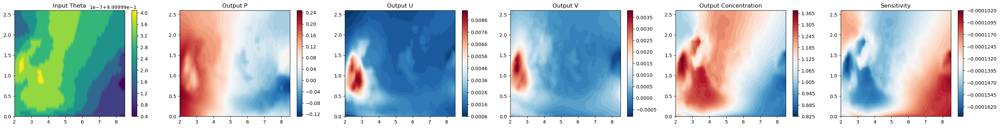

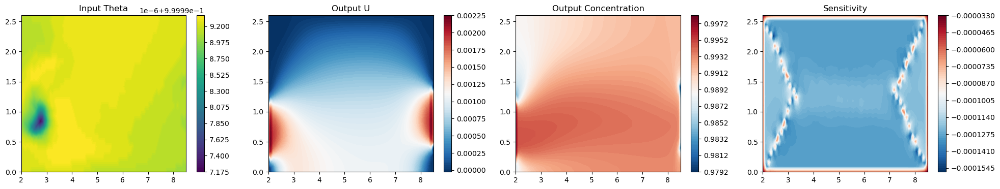

std of dx=9.635954256737023e-07, length of dxs =5
buffer length=5


C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=7.78005e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=7.3612e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=6.24884e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=7.23452e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=8.33458e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Pyt

Iter 120: J=2.058715864450278e-07, dist_gt=5.039740562438965, dist_q_r=2.5838935471256264e-05
std of dx=9.636009963287506e-07, length of dxs =5
buffer length=5


C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=7.74217e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=7.32767e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=6.20177e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=7.17282e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=8.25989e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Py

Iter 121: J=2.0587226856605412e-07, dist_gt=5.038357257843018, dist_q_r=2.8180746085126884e-05
std of dx=9.636049753680709e-07, length of dxs =5
buffer length=5


C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=7.70461e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=7.29446e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=6.15541e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=7.11208e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=8.18634e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Py

Iter 122: J=2.0587296489793516e-07, dist_gt=5.0383620262146, dist_q_r=3.0517720006173477e-05
std of dx=1.1225725984331802e-06, length of dxs =5
buffer length=5


C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=7.71026e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=7.27627e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=6.16434e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=7.13965e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=8.23041e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Py

Iter 123: J=2.0236443276644422e-07, dist_gt=5.038366317749023, dist_q_r=3.284991908003576e-05
std of dx=1.1225774869672023e-06, length of dxs =5
buffer length=5


C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=7.67686e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=7.24248e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=6.10641e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=6.54755e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=7.58316e-18): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Py

Iter 124: J=2.0498160324677883e-07, dist_gt=5.834325313568115, dist_q_r=3.5190561902709305e-05
std of dx=1.3120799167154473e-06, length of dxs =5
buffer length=5
Iter 125: J=1.992420806118389e-07, dist_gt=5.834330081939697, dist_q_r=2.585035872471053e-05


C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.22364e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.08881e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.68367e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=2.57983e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=3.7218e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Pyt

std of dx=1.3120787798470701e-06, length of dxs =5
buffer length=5
Iter 126: J=1.1915329878320335e-07, dist_gt=6.767797946929932, dist_q_r=2.8556294637382962e-05


C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.24078e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.00592e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=1.40381e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=2.19137e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Python\Python311\site-packages\mmapy\mma.py:418: LinAlgWarning: Ill-conditioned matrix (rcond=3.29539e-17): result may not be accurate.
  solut = solve(AA, bb)
C:\Users\cee3sgh\AppData\Roaming\Py

std of dx=1.5389309737656731e-06, length of dxs =5
buffer length=5
Iter 127: J=-2.1469131183948775e-07, dist_gt=6.76779842376709, dist_q_r=3.120650217169896e-05
std of dx=1.5389080090244533e-06, length of dxs =5
buffer length=5
Iter 128: J=-1.5021004173831898e-06, dist_gt=7.8611040115356445, dist_q_r=3.8922047679079697e-05
std of dx=1.806436330298311e-06, length of dxs =5
buffer length=5
Iter 129: J=-5.206458354223287e-06, dist_gt=7.861081123352051, dist_q_r=4.655246084439568e-05
std of dx=1.8064083633362316e-06, length of dxs =5
buffer length=5
Iter 130: J=-1.0585955351416487e-05, dist_gt=9.140226364135742, dist_q_r=5.595064067165367e-05
std of dx=2.1134960661584046e-06, length of dxs =5
buffer length=5
Iter 131: J=-2.5652978365542367e-05, dist_gt=9.140157699584961, dist_q_r=7.471482240362093e-05
std of dx=2.1135074348421767e-06, length of dxs =5
buffer length=5
Iter 132: J=-4.142777106608264e-05, dist_gt=10.635472297668457, dist_q_r=0.00011249176895944402
std of dx=2.4617377221147763

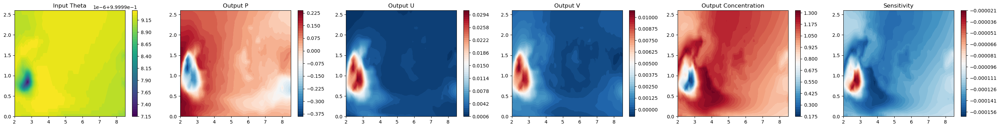

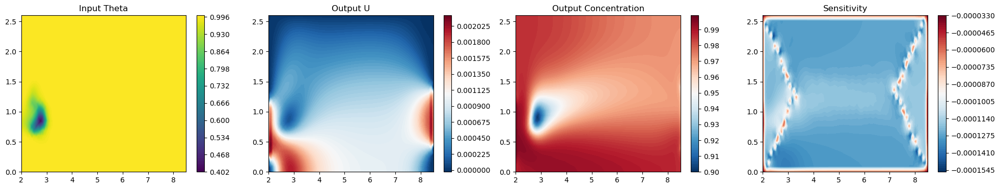

std of dx=3.8127780044305837e-06, length of dxs =5
buffer length=5
Iter 140: J=-0.004464347846806049, dist_gt=19.57540512084961, dist_q_r=0.002720168326050043
std of dx=3.818679488176713e-06, length of dxs =5
buffer length=5
Iter 141: J=-0.006640532519668341, dist_gt=19.78343391418457, dist_q_r=0.004077991936355829
std of dx=3.822962753474712e-06, length of dxs =5
buffer length=5
Iter 142: J=-0.009346787817776203, dist_gt=19.779024124145508, dist_q_r=0.005817017052322626
std of dx=4.388281467981869e-06, length of dxs =5
buffer length=5
Iter 143: J=-0.015423765406012535, dist_gt=19.773283004760742, dist_q_r=0.0077445171773433685
std of dx=4.402812919579446e-06, length of dxs =5
buffer length=5
Iter 144: J=-0.019005855545401573, dist_gt=23.034910202026367, dist_q_r=0.009884210303425789
std of dx=5.0540688789624255e-06, length of dxs =5
buffer length=5
Iter 145: J=-0.02790042757987976, dist_gt=23.028547286987305, dist_q_r=0.011803906410932541
std of dx=5.0710514187812805e-06, length of dx

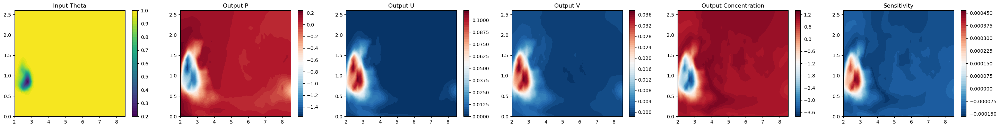

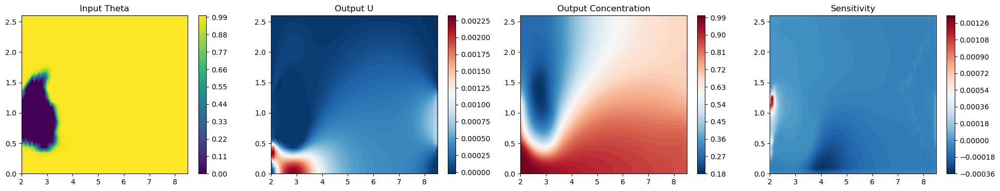

std of dx=1.4282531992648728e-05, length of dxs =5
buffer length=5
Iter 160: J=-0.20061182975769043, dist_gt=78.44807434082031, dist_q_r=0.013742904178798199
std of dx=1.4285491488408297e-05, length of dxs =5
buffer length=5
Iter 161: J=-0.2027486115694046, dist_gt=136.9739227294922, dist_q_r=0.015152817592024803
std of dx=1.4287427802628372e-05, length of dxs =5
buffer length=5
Iter 162: J=-0.20456287264823914, dist_gt=136.97169494628906, dist_q_r=0.016535267233848572
std of dx=1.6594427506788634e-05, length of dxs =5
buffer length=5
Iter 163: J=-0.24680538475513458, dist_gt=136.96969604492188, dist_q_r=0.01785925403237343
std of dx=1.660108864598442e-05, length of dxs =5
buffer length=5
Iter 164: J=-0.24870498478412628, dist_gt=159.63955688476562, dist_q_r=0.019317587837576866
std of dx=1.9313594748382457e-05, length of dxs =5
buffer length=5
Iter 165: J=-0.2986333668231964, dist_gt=159.63772583007812, dist_q_r=0.015317827463150024
std of dx=1.9316554244142026e-05, length of dxs =5
b

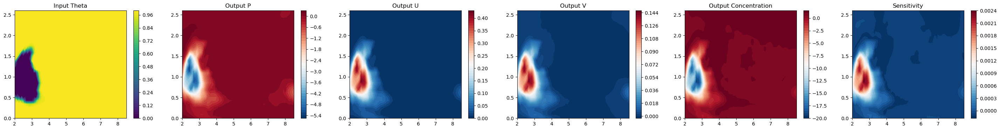

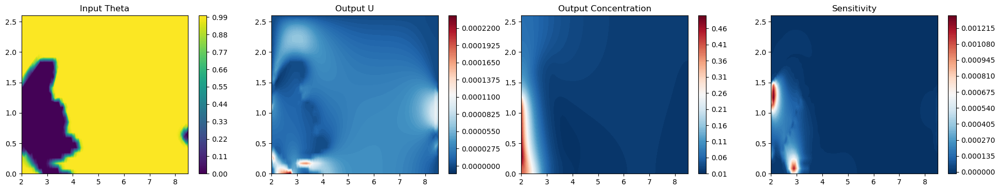

std of dx=5.676853106706403e-05, length of dxs =5
buffer length=5
Iter 180: J=-1.052419662475586, dist_gt=545.0263671875, dist_q_r=0.02038068324327469
std of dx=5.678579691448249e-05, length of dxs =5
buffer length=5
Iter 181: J=-1.055302381515503, dist_gt=4208.71923828125, dist_q_r=0.02239859104156494
std of dx=5.679663809132762e-05, length of dxs =5
buffer length=5
Iter 182: J=-1.057626485824585, dist_gt=4208.71142578125, dist_q_r=0.024184592068195343
std of dx=6.617982580792159e-05, length of dxs =5
buffer length=5
Iter 183: J=-1.2478783130645752, dist_gt=4208.70458984375, dist_q_r=0.025666480883955956
std of dx=6.61932208458893e-05, length of dxs =5
buffer length=5
Iter 184: J=-1.2496250867843628, dist_gt=4907.48486328125, dist_q_r=0.02704468183219433
std of dx=7.718251436017454e-05, length of dxs =5
buffer length=5
Iter 185: J=-1.4719321727752686, dist_gt=4907.47998046875, dist_q_r=0.021047130227088928
std of dx=7.719633140368387e-05, length of dxs =5
buffer length=5
Iter 186: J=-

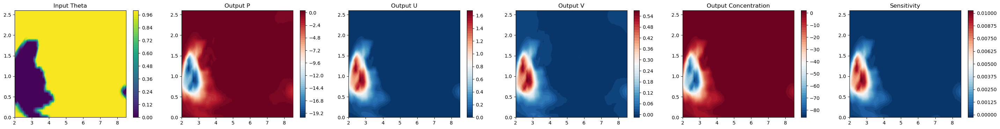

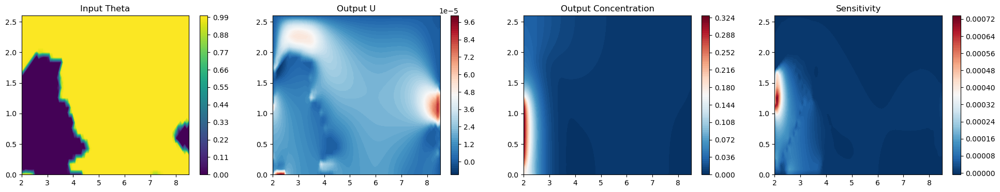

std of dx=0.00022697463282383978, length of dxs =5
buffer length=5
Iter 200: J=-4.523674964904785, dist_gt=16784.541015625, dist_q_r=0.010142162442207336
std of dx=0.00022696559608448297, length of dxs =5
buffer length=5
Iter 201: J=-4.524224281311035, dist_gt=23434.2578125, dist_q_r=0.010954773984849453
std of dx=0.00022696419910062104, length of dxs =5
buffer length=5
Iter 202: J=-4.5245466232299805, dist_gt=23434.212890625, dist_q_r=0.011747404001653194
std of dx=0.0002649084781296551, length of dxs =5
buffer length=5
Iter 203: J=-5.294734001159668, dist_gt=23434.177734375, dist_q_r=0.01248949021100998
std of dx=0.0002648671215865761, length of dxs =5
buffer length=5
Iter 204: J=-5.2950119972229, dist_gt=27329.443359375, dist_q_r=0.013259021565318108
std of dx=0.0003089778474532068, length of dxs =5
buffer length=5
Iter 205: J=-6.193841457366943, dist_gt=27329.412109375, dist_q_r=0.009696640074253082
std of dx=0.0003089404490310699, length of dxs =5
buffer length=5
Iter 206: J=-6.19

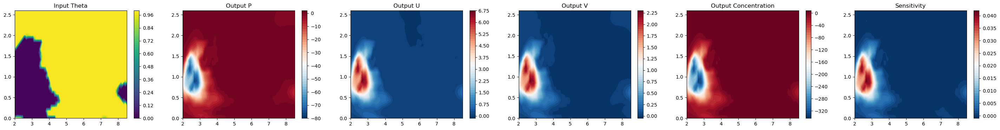

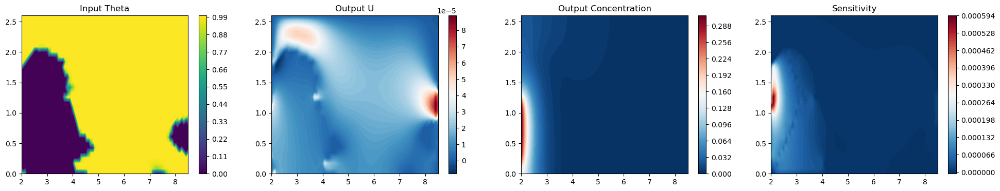

std of dx=0.000906361558008939, length of dxs =5
buffer length=5
Iter 220: J=-18.419635772705078, dist_gt=93535.5078125, dist_q_r=0.008358260616660118
std of dx=0.0009063081815838814, length of dxs =5
buffer length=5
Iter 221: J=-18.42007827758789, dist_gt=101324.8671875, dist_q_r=0.009139063768088818
std of dx=0.0009062549215741456, length of dxs =5
buffer length=5
Iter 222: J=-18.420581817626953, dist_gt=101324.7890625, dist_q_r=0.009990083985030651
std of dx=0.001057077432051301, length of dxs =5
buffer length=5
Iter 223: J=-21.506507873535156, dist_gt=101324.6953125, dist_q_r=0.01093942392617464
std of dx=0.0010570134036242962, length of dxs =5
buffer length=5
Iter 224: J=-21.506961822509766, dist_gt=118172.6953125, dist_q_r=0.01192044373601675
std of dx=0.0012328093871474266, length of dxs =5
buffer length=5
Iter 225: J=-25.1064395904541, dist_gt=118172.59375, dist_q_r=0.009503870271146297
std of dx=0.0012327376753091812, length of dxs =5
buffer length=5
Iter 226: J=-25.1066551208

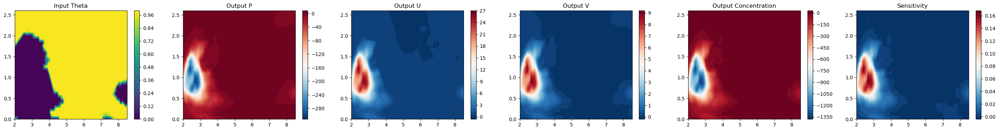

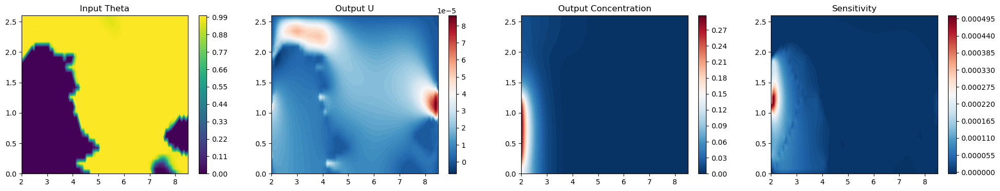

std of dx=0.0036196003202348948, length of dxs =5
buffer length=5
Iter 240: J=-73.98491668701172, dist_gt=404561.1875, dist_q_r=0.009324309416115284
std of dx=0.003619499271735549, length of dxs =5
buffer length=5
Iter 241: J=-73.98521423339844, dist_gt=430943.25, dist_q_r=0.010375902988016605
std of dx=0.003619452239945531, length of dxs =5
buffer length=5
Iter 242: J=-73.98564147949219, dist_gt=430943.125, dist_q_r=0.011499077081680298
std of dx=0.00422283262014389, length of dxs =5
buffer length=5
Iter 243: J=-86.31631469726562, dist_gt=430942.96875, dist_q_r=0.012642446905374527
std of dx=0.004222817253321409, length of dxs =5
buffer length=5
Iter 244: J=-86.31818389892578, dist_gt=502619.71875, dist_q_r=0.014294172637164593
std of dx=0.004926232621073723, length of dxs =5
buffer length=5
Iter 245: J=-100.70368957519531, dist_gt=502619.53125, dist_q_r=0.012422330677509308
std of dx=0.00492616044357419, length of dxs =5
buffer length=5
Iter 246: J=-100.70869445800781, dist_gt=586224

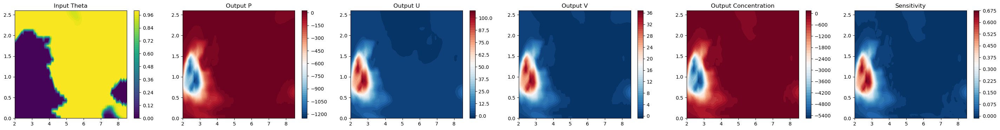

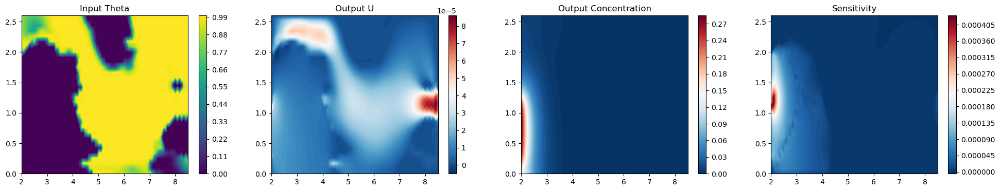

std of dx=0.014492182992398739, length of dxs =5
buffer length=5
Iter 260: J=-296.4308166503906, dist_gt=1722553.0, dist_q_r=0.0350579172372818
std of dx=0.014492078684270382, length of dxs =5
buffer length=5
Iter 261: J=-296.43798828125, dist_gt=1774228.25, dist_q_r=0.038939353078603745
std of dx=0.014491952955722809, length of dxs =5
buffer length=5
Iter 262: J=-296.4430236816406, dist_gt=1774227.75, dist_q_r=0.04255916550755501
std of dx=0.01691199094057083, length of dxs =5
buffer length=5
Iter 263: J=-345.8780822753906, dist_gt=1774227.375, dist_q_r=0.0459761768579483
std of dx=0.0169120654463768, length of dxs =5
buffer length=5
Iter 264: J=-345.88226318359375, dist_gt=2070094.25, dist_q_r=0.04968944564461708
std of dx=0.019736776128411293, length of dxs =5
buffer length=5
Iter 265: J=-403.57366943359375, dist_gt=2070093.875, dist_q_r=0.03959282115101814
std of dx=0.019736794754862785, length of dxs =5
buffer length=5
Iter 266: J=-403.57781982421875, dist_gt=2415605.25, dist_q_r=

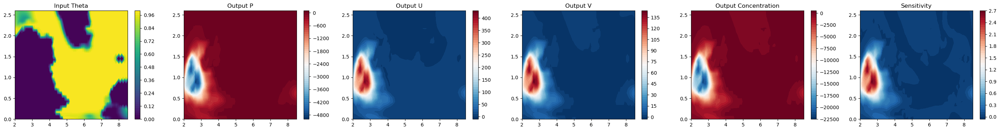

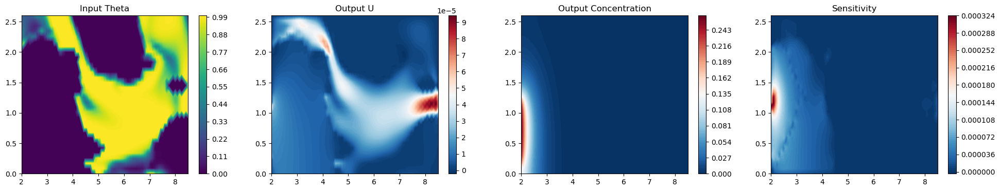

std of dx=0.05839412659406662, length of dxs =5
buffer length=5
Iter 280: J=-1190.2381591796875, dist_gt=7180153.0, dist_q_r=0.03607204183936119
std of dx=0.05839395523071289, length of dxs =5
buffer length=5
Iter 281: J=-1190.2415771484375, dist_gt=7833706.5, dist_q_r=0.03993379697203636
std of dx=0.058393850922584534, length of dxs =5
buffer length=5
Iter 282: J=-1190.243896484375, dist_gt=7833706.5, dist_q_r=0.04341816157102585
std of dx=0.06823645532131195, length of dxs =5
buffer length=5
Iter 283: J=-1389.647705078125, dist_gt=7833706.5, dist_q_r=0.04646538943052292
std of dx=0.06823617219924927, length of dxs =5
buffer length=5
Iter 284: J=-1389.649658203125, dist_gt=9177952.0, dist_q_r=0.050285715609788895
std of dx=0.07975873351097107, length of dxs =5
buffer length=5
Iter 285: J=-1622.700927734375, dist_gt=9177952.0, dist_q_r=0.041086345911026
std of dx=0.07975822687149048, length of dxs =5
buffer length=5
Iter 286: J=-1622.703369140625, dist_gt=10767387.0, dist_q_r=0.0453309

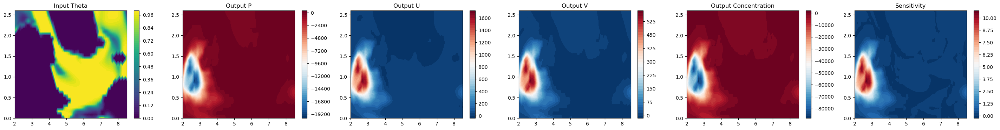

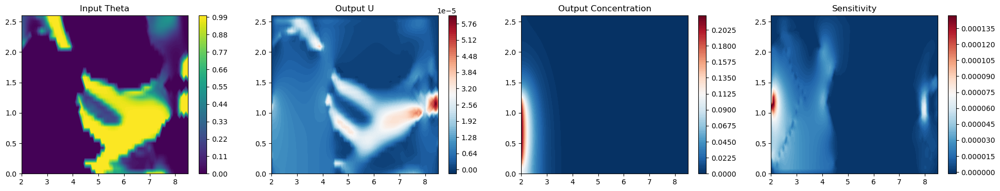

[Graph(num_nodes=4959, num_edges=0,
       ndata_schemes={'x': Scheme(shape=(4,), dtype=torch.float32), 'y': Scheme(shape=(5,), dtype=torch.float32)}
       edata_schemes={})]

In [27]:
for i in range(opt_iter):   
    # if i < opt_iter: continue
    # The variables to be updated
    # Make the computation graph start with x_orig 
    x_orig = x_orig.detach().clone()
    x_orig.requires_grad = True
    
    updated_gt = False
    dist_gt = torch.tensor(0.)
    dist_q_r = (x_r_orig - x_orig)[:, theta_dim].abs().mean().detach()
    if y_gt is not None:
        # dist_gt = relp_dist(x_gt, x_orig)
        dist_gt = relp_dist(y_gt[:, :-1], y_pred_orig[:, :-1])
    
    # Update ref with GT
    if i >= warm_up:
        # if dist_gt==0 or (i - i_pre >= check_step or dist_gt > rad_gt):  
        if (i - warm_up) % 20 == 0:       
            print(f'Update GT reference.')
            # print(f'J={J}, J_min={J_min}, check_idx={check_idx}')
            buffer_old = g_r_buffer
            g_r_buffer = update_ref(x_orig, q_params, model_mph) # reset buffer
            updated_gt = True
            x_r = g_r_buffer[0].ndata['x'].detach().clone()
            y_r = g_r_buffer[0].ndata['y'].detach().clone()
            x_r_orig = x_norm.transform(x_r, inverse=True)
            y_r_orig = y_norm.transform(y_r, inverse=True)
            x_gt = x_r_orig.detach().clone()
            y_gt = y_r_orig.detach().clone()
            gt_idx += 1
            i_pre = i
            g_r_buffer = buffer_old
            
            # save data
            # torch.save((x_gt, y_gt), data_path + f'{gt_idx}.pt')
            # print('Difference between x_gt and x_orig: ', (x_gt[:, 2] - x_orig[:, 2]).abs().sum())
    
    # Get model prediction and gradient
    dx, y_pred_orig, J = multi_history(x_orig, g_r_buffer, num_pertub, model, i==0)        

    # Sensitivity filtering
    dx = gaussian_filter_sensitivity(dx, x_q, filter_radius, sigma)

    # Buffer model predictions
    if not updated_gt and i % buffer_step == 0:            
        g_r = dgl.DGLGraph() 
        g_r.add_nodes(x_orig.shape[0])
        g_r.ndata['x'] = x_norm.transform(x_orig, inverse=False).detach().clone()
        g_r.ndata['y'] = y_norm.transform(y_pred_orig, inverse=False).detach().clone()
        if i==0: g_r_buffer.pop(0) # drop dummy reference after first iter
        g_r_buffer += [g_r]
        while len(g_r_buffer) > buffer_size:
            g_r_buffer.pop(0)
    print(f'buffer length={len(g_r_buffer)}')          

    # Update x_orig
    if use_MMA:
    # if i < opt_iter / 3 :
    # if False:
        # MMA needs to scale J in (1, 100). Correspondingly, scale gradient
        x_orig.requires_grad = False
        x_orig[:, 2], xold1, xold2, dx, J = x_orig[:, 2] * mma_scale_x , xold1 * mma_scale_x, xold2 * mma_scale_x, dx * mma_scale_J, J * mma_scale_J
        theta_max = mma_scale_x * theta_max
        x_orig, xold1, xold2 = update_MMA(x_orig, xold1, xold2, i, theta_min, theta_max, dx, J)
        x_orig[:, 2], xold1, xold2, dx, J = (x_orig[:, 2]) / mma_scale_x, (xold1 ) / mma_scale_x, (xold2) / mma_scale_x, dx / mma_scale_J, J / mma_scale_J
        theta_max = theta_max / mma_scale_x
        # print('dx:', dx.abs().max())
    else:
        dx = -dx
        x_orig = update_GD(x_orig, dx, i, rad_gt, alpha=1e3)

    print(f'Iter {i}: J={J.item()}, dist_gt={dist_gt.item()}, dist_q_r={dist_q_r.item()}')
    
    if (i+1) % log_steps == 0 or updated_gt:
        x_r = g_r_buffer[0].ndata['x']
        y_r = g_r_buffer[0].ndata['y']
        x_r_orig = x_norm.transform(x_r, inverse=True)
        y_r_orig = y_norm.transform(y_r, inverse=True)

        obj = J.item()
        if updated_gt:
            obj = np.loadtxt('update_objective.txt', skiprows=9)[0, -1]
            obj_track.append(obj)
            plot_input_output(x_orig, y_pred_orig, x_r_orig, y_r_orig, i, obj, fig_path)
            plot_fig(x_orig.detach(), y_pred_orig.detach())
        else:
            plot_input_output(x_orig, y_pred_orig, x_r_orig, y_r_orig, i, obj, fig_path)

    # if i == 100: break

torch.save(obj_track, fig_path + f'/obj.pt')
update_ref(x_orig, q_params, model_mph) # Validate the final results

std of dx=6.801413405810308e-07, length of dxs =5
buffer length=5
Iter 300: J=0.037004563957452774, dist_gt=0.21876651048660278, dist_q_r=0.0012936640996485949
std of dx=7.015606797722285e-07, length of dxs =5
buffer length=5
Iter 301: J=0.0371430478990078, dist_gt=0.21887841820716858, dist_q_r=0.0014153335941955447
std of dx=7.009702471805213e-07, length of dxs =5
buffer length=5
Iter 302: J=0.03713821992278099, dist_gt=0.23261727392673492, dist_q_r=0.0015338425291702151
std of dx=7.175531209213659e-07, length of dxs =5
buffer length=5
Iter 303: J=0.03728475794196129, dist_gt=0.23267273604869843, dist_q_r=0.0016565783880650997
std of dx=7.155912840062228e-07, length of dxs =5
buffer length=5
Iter 304: J=0.037278804928064346, dist_gt=0.2462887465953827, dist_q_r=0.0017750338884070516
std of dx=7.2203425816042e-07, length of dxs =5
buffer length=5
Iter 305: J=0.037433553487062454, dist_gt=0.24629059433937073, dist_q_r=0.0011269180104136467
std of dx=7.203536824818002e-07, length of dxs 

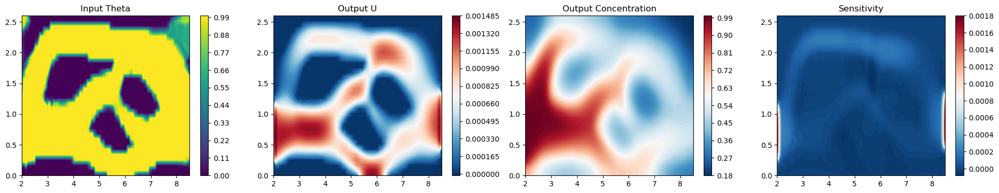

C:\Users\cee3sgh\AppData\Local\Temp\ipykernel_17504\1528009123.py:179: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1760.)
  print(f'std of dx={dxs.std(dim=0).mean(dim=0).detach().item()}, length of dxs ={len(dxs)}')


std of dx=nan, length of dxs =1
buffer length=1
Iter 329: J=0.03671570122241974, dist_gt=0.4000956416130066, dist_q_r=0.0032676581759005785
std of dx=nan, length of dxs =1
buffer length=2
Iter 330: J=0.03670644387602806, dist_gt=0.046293988823890686, dist_q_r=0.00022024998906999826
std of dx=8.921198855205148e-07, length of dxs =2
buffer length=2
Iter 331: J=0.03666587173938751, dist_gt=0.04647694528102875, dist_q_r=0.00037721917033195496
std of dx=8.921119842852931e-07, length of dxs =2
buffer length=3
Iter 332: J=0.03665740787982941, dist_gt=0.06953045725822449, dist_q_r=0.0005759029882028699
std of dx=9.60308852882008e-07, length of dxs =3
buffer length=3
Iter 333: J=0.036664362996816635, dist_gt=0.0697823092341423, dist_q_r=0.0007735154940746725
std of dx=9.58503392212151e-07, length of dxs =3
buffer length=4
Iter 334: J=0.03665648773312569, dist_gt=0.08522982895374298, dist_q_r=0.0009580429759807885
std of dx=1.0028289807451074e-06, length of dxs =4
buffer length=4
Iter 335: J=0.0

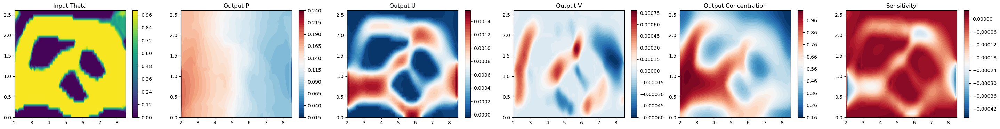

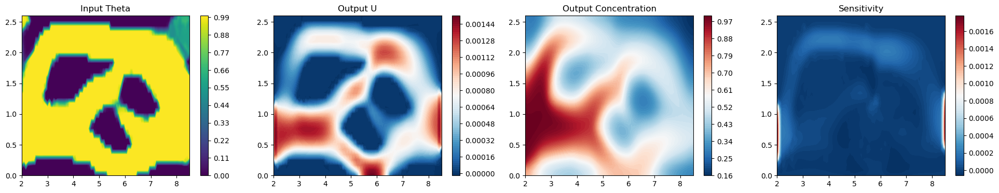

std of dx=nan, length of dxs =1
buffer length=1
Iter 380: J=0.03673374652862549, dist_gt=0.40219900012016296, dist_q_r=0.0019098208285868168
std of dx=nan, length of dxs =1
buffer length=1
Iter 381: J=0.036726780235767365, dist_gt=0.04671286419034004, dist_q_r=0.00018910864309873432
std of dx=nan, length of dxs =1
buffer length=2
Iter 382: J=0.03672168031334877, dist_gt=0.046859558671712875, dist_q_r=0.00031694109202362597
std of dx=9.024524274536816e-07, length of dxs =2
buffer length=2
Iter 383: J=0.03674084320664406, dist_gt=0.04700753837823868, dist_q_r=0.0005013146437704563
std of dx=9.010091162053868e-07, length of dxs =2
buffer length=3
Iter 384: J=0.03673430532217026, dist_gt=0.07034840434789658, dist_q_r=0.0006680432707071304
std of dx=9.70660153143399e-07, length of dxs =3
buffer length=3
Iter 385: J=0.036779675632715225, dist_gt=0.07064030319452286, dist_q_r=0.0008332943543791771
std of dx=9.695372682472225e-07, length of dxs =3
buffer length=4
Iter 386: J=0.0367738157510757

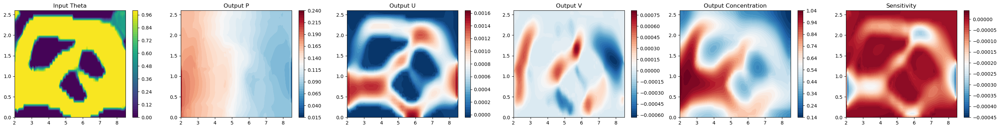

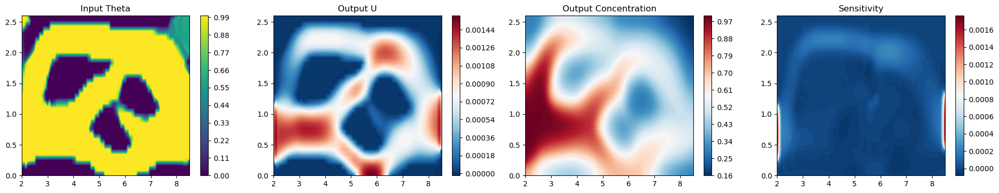

std of dx=nan, length of dxs =1
buffer length=1
Iter 432: J=0.03676896542310715, dist_gt=0.40932807326316833, dist_q_r=0.0023696713615208864
std of dx=nan, length of dxs =1
buffer length=1
Iter 433: J=0.036761365830898285, dist_gt=0.04650532454252243, dist_q_r=0.00019446796795818955
std of dx=nan, length of dxs =1
buffer length=2
Iter 434: J=0.03675560653209686, dist_gt=0.046612825244665146, dist_q_r=0.00032858308986760676
std of dx=9.134693073065137e-07, length of dxs =2
buffer length=2
Iter 435: J=0.03682074695825577, dist_gt=0.04675327613949776, dist_q_r=0.0005165000911802053
std of dx=9.122595656663179e-07, length of dxs =2
buffer length=3
Iter 436: J=0.036813829094171524, dist_gt=0.0699627622961998, dist_q_r=0.0006862450391054153
std of dx=9.859522833721712e-07, length of dxs =3
buffer length=3
Iter 437: J=0.0368863083422184, dist_gt=0.07023678719997406, dist_q_r=0.0008538041147403419
std of dx=9.836135177465621e-07, length of dxs =3
buffer length=4
Iter 438: J=0.03688031062483787

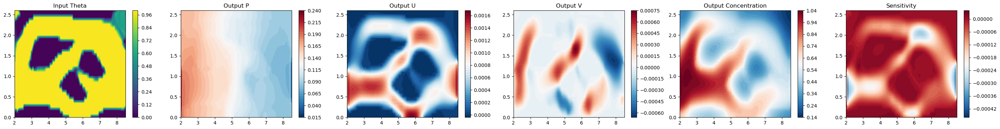

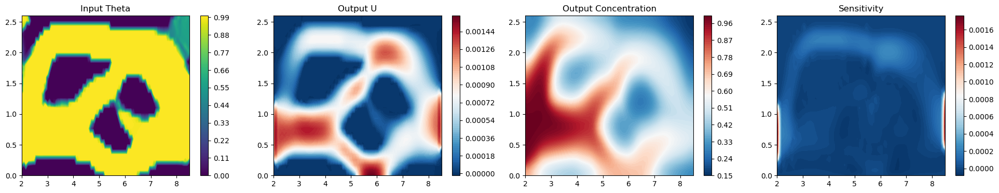

std of dx=nan, length of dxs =1
buffer length=1
Iter 484: J=0.03685899078845978, dist_gt=0.4035016894340515, dist_q_r=0.002611864823848009
std of dx=nan, length of dxs =1
buffer length=1
Iter 485: J=0.03685157001018524, dist_gt=0.045976672321558, dist_q_r=0.00019200367387384176
std of dx=nan, length of dxs =1
buffer length=2
Iter 486: J=0.03684587776660919, dist_gt=0.04599940776824951, dist_q_r=0.00032560809631831944
std of dx=9.247576713278249e-07, length of dxs =2
buffer length=2
Iter 487: J=0.03692298009991646, dist_gt=0.04603234678506851, dist_q_r=0.0005148265627212822
std of dx=9.234665299118205e-07, length of dxs =2
buffer length=3
Iter 488: J=0.036915600299835205, dist_gt=0.06883485615253448, dist_q_r=0.0006862219306640327
std of dx=9.962486728909425e-07, length of dxs =3
buffer length=3
Iter 489: J=0.036995213478803635, dist_gt=0.06894318759441376, dist_q_r=0.000856574741192162
std of dx=9.930739679475664e-07, length of dxs =3
buffer length=4
Iter 490: J=0.03698878362774849, di

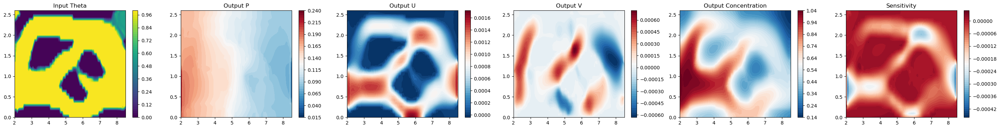

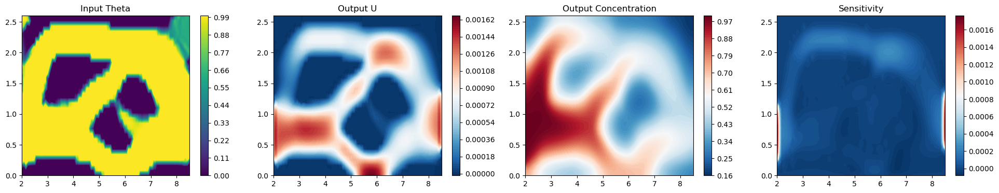

std of dx=nan, length of dxs =1
buffer length=1
Iter 538: J=0.036939386278390884, dist_gt=0.41114342212677, dist_q_r=0.0027776635251939297
std of dx=nan, length of dxs =1
buffer length=1
Iter 539: J=0.03693008795380592, dist_gt=0.04549076408147812, dist_q_r=0.00023034258629195392
std of dx=nan, length of dxs =1
buffer length=2
Iter 540: J=0.0369231216609478, dist_gt=0.04549095779657364, dist_q_r=0.00039049057522788644
std of dx=9.354707799502648e-07, length of dxs =2
buffer length=2
Iter 541: J=0.03701752424240112, dist_gt=0.04553171619772911, dist_q_r=0.0006141053745523095
std of dx=9.358795409752929e-07, length of dxs =2
buffer length=3
Iter 542: J=0.03700890392065048, dist_gt=0.06808939576148987, dist_q_r=0.0008182678720913827
std of dx=1.0084012274091947e-06, length of dxs =3
buffer length=3
Iter 543: J=0.03709845244884491, dist_gt=0.06822028011083603, dist_q_r=0.001020156079903245
std of dx=1.0066498816740932e-06, length of dxs =3
buffer length=4
Iter 544: J=0.03709103539586067, d

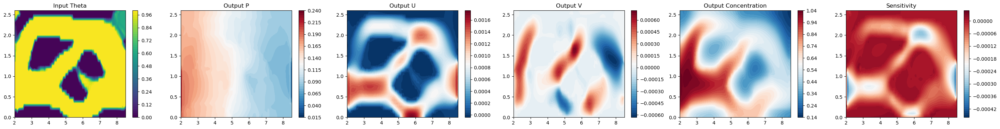

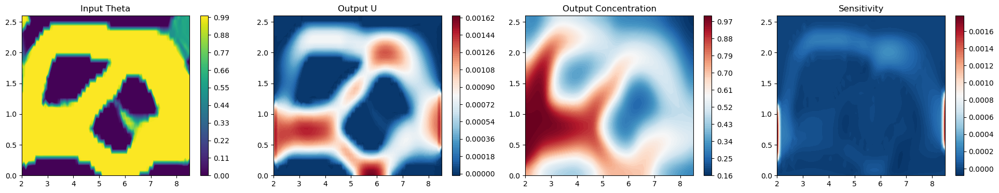

std of dx=nan, length of dxs =1
buffer length=1
Iter 592: J=0.0370621420443058, dist_gt=0.407866507768631, dist_q_r=0.002417457988485694
std of dx=nan, length of dxs =1
buffer length=1
Iter 593: J=0.03705181926488876, dist_gt=0.04507046192884445, dist_q_r=0.0002354879688937217
std of dx=nan, length of dxs =1
buffer length=2
Iter 594: J=0.037044234573841095, dist_gt=0.04507780075073242, dist_q_r=0.00039905545418150723
std of dx=9.442993018637935e-07, length of dxs =2
buffer length=2
Iter 595: J=0.037147194147109985, dist_gt=0.04510226473212242, dist_q_r=0.0006270445883274078
std of dx=9.430208933736139e-07, length of dxs =2
buffer length=3
Iter 596: J=0.037137653678655624, dist_gt=0.06744758784770966, dist_q_r=0.0008351002470590174
std of dx=1.017118847812526e-06, length of dxs =3
buffer length=3
Iter 597: J=0.03723202273249626, dist_gt=0.06761948764324188, dist_q_r=0.001041163457557559
std of dx=1.0147765578949475e-06, length of dxs =3
buffer length=4
Iter 598: J=0.03722356632351875, d

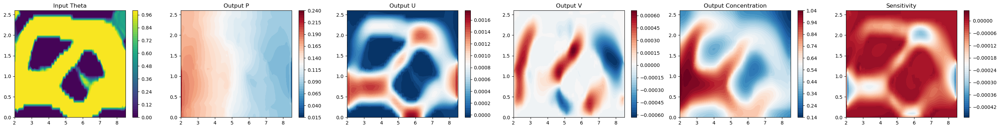

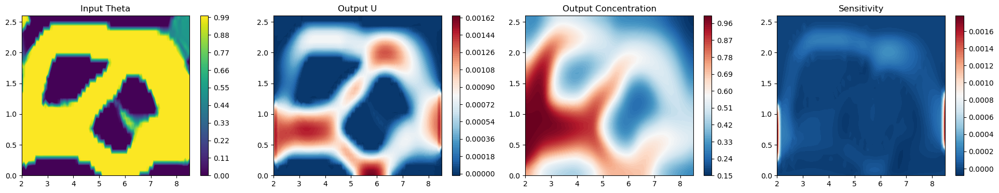

[Graph(num_nodes=4959, num_edges=0,
       ndata_schemes={'x': Scheme(shape=(4,), dtype=torch.float32), 'y': Scheme(shape=(5,), dtype=torch.float32)}
       edata_schemes={})]

c:\Program Files\Anaconda3\envs\rno_opt\Lib\site-packages\dgl\heterograph.py:92: DGLWarning: Recommend creating graphs by `dgl.graph(data)` instead of `dgl.DGLGraph(data)`.
  dgl_warning(


std of dx=0.0, length of dxs =5
buffer length=5
Iter 0: J=0.04656606540083885, dist_gt=0.0, dist_q_r=0.030393028631806374
std of dx=8.750925189815462e-06, length of dxs =5
buffer length=5
Iter 1: J=0.027425110340118408, dist_gt=0.0, dist_q_r=0.027974342927336693
std of dx=1.0213888344878796e-05, length of dxs =5
buffer length=5
Iter 2: J=0.026181738823652267, dist_gt=0.0, dist_q_r=0.030307486653327942
std of dx=1.0604877388686873e-05, length of dxs =5
buffer length=5
Iter 3: J=0.027017895132303238, dist_gt=0.0, dist_q_r=0.031134873628616333
std of dx=1.0611357538437005e-05, length of dxs =5
buffer length=5
Iter 4: J=0.026970980688929558, dist_gt=0.0, dist_q_r=0.031779151409864426
std of dx=1.0467644642631058e-05, length of dxs =5
buffer length=5
Iter 5: J=0.028168294578790665, dist_gt=0.0, dist_q_r=0.013720665127038956
std of dx=1.0532843589317054e-05, length of dxs =5
buffer length=5
Iter 6: J=0.02813875302672386, dist_gt=0.0, dist_q_r=0.014807082712650299
std of dx=1.0217482667940203

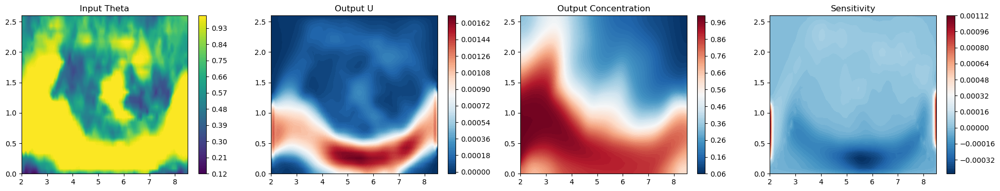

C:\Users\cee3sgh\AppData\Local\Temp\ipykernel_17504\1528009123.py:179: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1760.)
  print(f'std of dx={dxs.std(dim=0).mean(dim=0).detach().item()}, length of dxs ={len(dxs)}')


std of dx=nan, length of dxs =1
buffer length=1
Iter 20: J=0.02213437668979168, dist_gt=0.0, dist_q_r=0.011941339820623398
std of dx=nan, length of dxs =1
buffer length=1
Iter 21: J=0.02155368961393833, dist_gt=0.03511519730091095, dist_q_r=0.004686538130044937
std of dx=nan, length of dxs =1
buffer length=2
Iter 22: J=0.021158721297979355, dist_gt=0.03842450678348541, dist_q_r=0.008182109333574772
std of dx=2.5040565105882706e-06, length of dxs =2
buffer length=2
Iter 23: J=0.0207684189081192, dist_gt=0.042536571621894836, dist_q_r=0.011861658655107021
std of dx=2.4788705559330992e-06, length of dxs =2
buffer length=3
Iter 24: J=0.02044808492064476, dist_gt=0.06235551834106445, dist_q_r=0.015247127041220665
std of dx=3.000205879288842e-06, length of dxs =3
buffer length=3
Iter 25: J=0.020321404561400414, dist_gt=0.06699813902378082, dist_q_r=0.018241439014673233
std of dx=3.021660177182639e-06, length of dxs =3
buffer length=4
Iter 26: J=0.020100710913538933, dist_gt=0.080222889780998

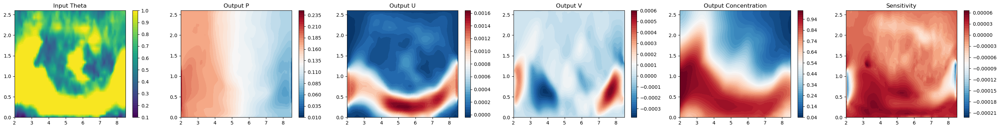

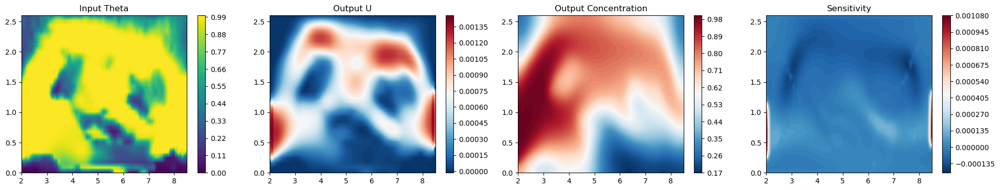

std of dx=nan, length of dxs =1
buffer length=1
Iter 66: J=0.02742709405720234, dist_gt=0.4104900658130646, dist_q_r=0.019743453711271286
std of dx=nan, length of dxs =1
buffer length=1
Iter 67: J=0.02675708942115307, dist_gt=0.04102267324924469, dist_q_r=0.004240547306835651
std of dx=nan, length of dxs =1
buffer length=2
Iter 68: J=0.026310592889785767, dist_gt=0.04312494024634361, dist_q_r=0.007277614902704954
std of dx=2.1424013993964763e-06, length of dxs =2
buffer length=2
Iter 69: J=0.026062630116939545, dist_gt=0.04983358085155487, dist_q_r=0.010967965237796307
std of dx=1.8939082337965374e-06, length of dxs =2
buffer length=3
Iter 70: J=0.025720518082380295, dist_gt=0.06838271766901016, dist_q_r=0.013938684947788715
std of dx=2.2345780053001363e-06, length of dxs =3
buffer length=3
Iter 71: J=0.025776470080018044, dist_gt=0.07323413342237473, dist_q_r=0.01667521707713604
std of dx=2.1513840238185367e-06, length of dxs =3
buffer length=4
Iter 72: J=0.025556499138474464, dist_gt

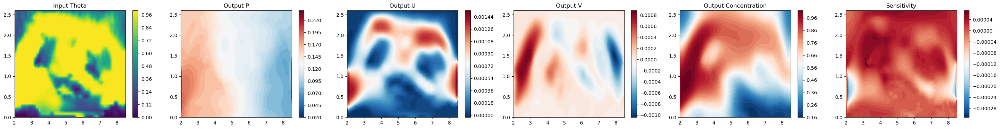

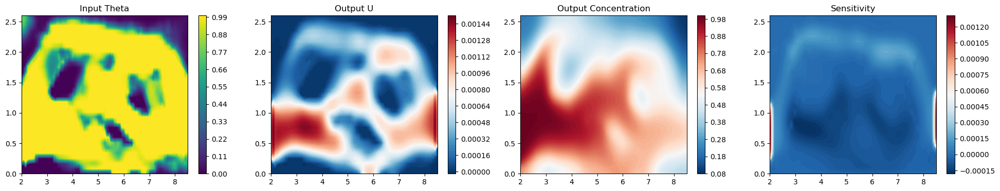

std of dx=nan, length of dxs =1
buffer length=1
Iter 113: J=0.03107290342450142, dist_gt=0.4018034040927887, dist_q_r=0.019784731790423393
std of dx=nan, length of dxs =1
buffer length=2
Iter 114: J=0.030918167904019356, dist_gt=0.043518807739019394, dist_q_r=0.00139334995765239
std of dx=1.1327711035846733e-06, length of dxs =2
buffer length=2
Iter 115: J=0.03071017935872078, dist_gt=0.04093702882528305, dist_q_r=0.0024675638414919376
std of dx=1.1360280041117221e-06, length of dxs =2
buffer length=3
Iter 116: J=0.03058803454041481, dist_gt=0.060522936284542084, dist_q_r=0.0037300039548426867
std of dx=1.2675446896537323e-06, length of dxs =3
buffer length=3
Iter 117: J=0.030528200790286064, dist_gt=0.06085291877388954, dist_q_r=0.004933335352689028
std of dx=1.2652826626435854e-06, length of dxs =3
buffer length=4
Iter 118: J=0.030436275526881218, dist_gt=0.07413807511329651, dist_q_r=0.006058252416551113
std of dx=1.371768689750752e-06, length of dxs =4
buffer length=4
Iter 119: J=0

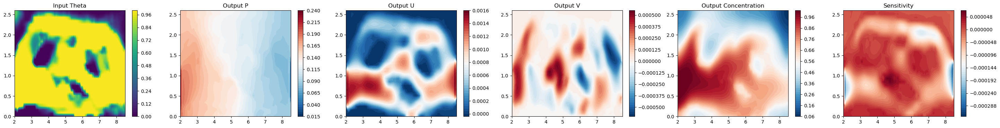

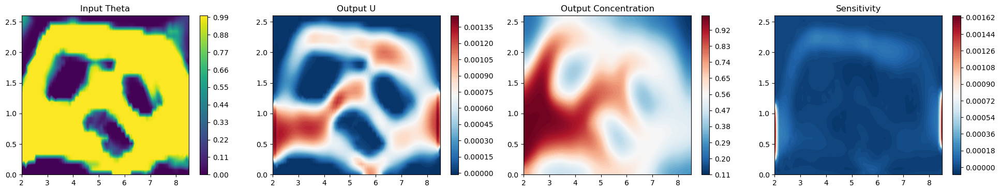

std of dx=nan, length of dxs =1
buffer length=1
Iter 172: J=0.03556802123785019, dist_gt=0.4082583487033844, dist_q_r=0.007803177461028099
std of dx=nan, length of dxs =1
buffer length=1
Iter 173: J=0.035529427230358124, dist_gt=0.04468969628214836, dist_q_r=0.0005816353368572891
std of dx=nan, length of dxs =1
buffer length=2
Iter 174: J=0.035497382283210754, dist_gt=0.04516271501779556, dist_q_r=0.0010665786685422063
std of dx=9.751937568580615e-07, length of dxs =2
buffer length=2
Iter 175: J=0.035316310822963715, dist_gt=0.04578319936990738, dist_q_r=0.0016347228083759546
std of dx=9.644393230701098e-07, length of dxs =2
buffer length=3
Iter 176: J=0.03528290241956711, dist_gt=0.06840598583221436, dist_q_r=0.0021726847626268864
std of dx=1.0469070730323438e-06, length of dxs =3
buffer length=3
Iter 177: J=0.035209137946367264, dist_gt=0.06948205828666687, dist_q_r=0.0026940577663481236
std of dx=1.0379433206253452e-06, length of dxs =3
buffer length=4
Iter 178: J=0.0351801440119743

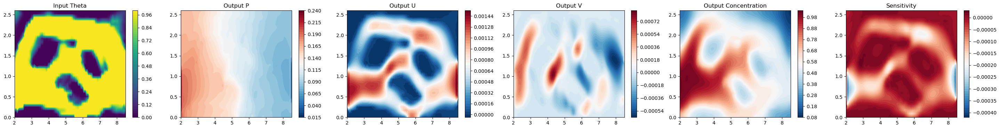

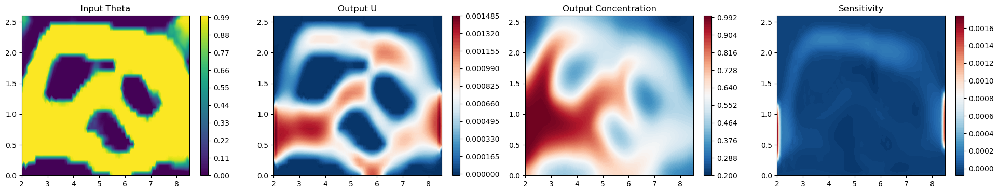

std of dx=nan, length of dxs =1
buffer length=1
Iter 222: J=0.03617767244577408, dist_gt=0.40518009662628174, dist_q_r=0.006136014591902494
std of dx=nan, length of dxs =1
buffer length=1
Iter 223: J=0.03615909069776535, dist_gt=0.04577730596065521, dist_q_r=0.00034723649150691926
std of dx=nan, length of dxs =1
buffer length=2
Iter 224: J=0.03614504262804985, dist_gt=0.04614764824509621, dist_q_r=0.0006004652823321521
std of dx=9.127853104473616e-07, length of dxs =2
buffer length=2
Iter 225: J=0.03600440174341202, dist_gt=0.04656829684972763, dist_q_r=0.0009341504191979766
std of dx=9.085622423299355e-07, length of dxs =2
buffer length=3
Iter 226: J=0.03598839044570923, dist_gt=0.06956113129854202, dist_q_r=0.001244656858034432
std of dx=9.792535138331004e-07, length of dxs =3
buffer length=3
Iter 227: J=0.035935401916503906, dist_gt=0.07010715454816818, dist_q_r=0.001548874657601118
std of dx=9.755904102348723e-07, length of dxs =3
buffer length=4
Iter 228: J=0.03592116758227348, di

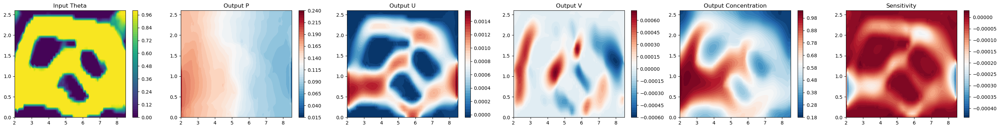

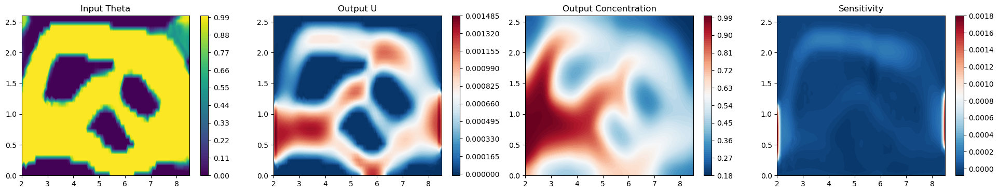

std of dx=nan, length of dxs =1
buffer length=1
Iter 276: J=0.036614395678043365, dist_gt=0.4048903286457062, dist_q_r=0.0028646376449614763
std of dx=nan, length of dxs =1
buffer length=1
Iter 277: J=0.03660440817475319, dist_gt=0.04582156240940094, dist_q_r=0.00023736122238915414
std of dx=nan, length of dxs =1
buffer length=2
Iter 278: J=0.03659629449248314, dist_gt=0.04613979905843735, dist_q_r=0.00041366671212017536
std of dx=9.016721946863981e-07, length of dxs =2
buffer length=2
Iter 279: J=0.036497339606285095, dist_gt=0.04646860808134079, dist_q_r=0.0006457542185671628
std of dx=9.005968308883894e-07, length of dxs =2
buffer length=3
Iter 280: J=0.0364883691072464, dist_gt=0.0694778561592102, dist_q_r=0.0008586007170379162
std of dx=9.694471145849093e-07, length of dxs =3
buffer length=3
Iter 281: J=0.036463264375925064, dist_gt=0.06998614966869354, dist_q_r=0.0010690042981877923
std of dx=9.694266509541194e-07, length of dxs =3
buffer length=4
Iter 282: J=0.03645527362823486,

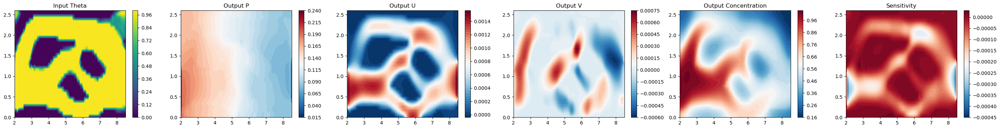

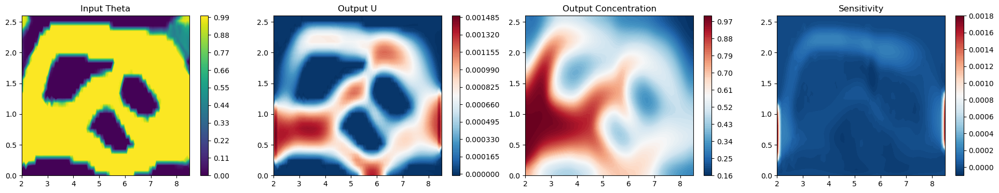

[Graph(num_nodes=4959, num_edges=0,
       ndata_schemes={'x': Scheme(shape=(4,), dtype=torch.float32), 'y': Scheme(shape=(5,), dtype=torch.float32)}
       edata_schemes={})]

In [ ]:
plot_input_output(x_orig, y_pred_orig, x_r_orig, y_r_orig, i, obj, fig_path)

In [ ]:
update_ref(x_orig, q_params, model_mph) # Validate the final results

In [ ]:
plot_fig(x_orig.detach(), y_pred_orig.detach())

In [16]:
q_params

{'w_r': 6.5, 'h_r': 2.6, 'y_in': 0.2, 'y_out': 0.4}

In [28]:
torch.load(fig_path + f'/obj.pt')

[0.02266904319068575,
 0.019816984489897067,
 0.0016823376721631234,
 0.0013395590410045148,
 0.001339447955056237,
 0.0013393378383037668,
 0.002852457288209306,
 0.008382964270966962,
 0.003556042079708195,
 0.0023952572879314686,
 0.0022047266129993147,
 0.0020997987890099957,
 0.0020088374960363915,
 0.001851064049474504]

In [18]:
torch.load(fig_path + f'/obj.pt')

[0.022865218992735744,
 0.027814024585029715,
 0.03102837876292906,
 0.03575554404174552,
 0.03642814594830549,
 0.03688230500364447,
 0.03688845262179352,
 0.0367564974887303,
 0.03667530158606763,
 0.036756785563027077,
 0.03682719162991393,
 0.03694095048674736]

In [ ]:
# plt.hist(dx.view(-1), bins=10)
dm = x_orig[:, -1].bool()
cs = plt.scatter(x_orig[dm, 0].detach(), x_orig[dm, 1].detach(), c=dx[dm].view(-1))
plt.colorbar(cs)
plt.show()
cs = plt.scatter(x_orig[dm, 0].detach(), x_orig[dm, 1].detach(), c=x_orig[dm, 2].detach())
plt.colorbar(cs)
plt.show()
cs = plt.scatter(x_orig[dm, 0].detach(), x_orig[dm, 1].detach(), c=x_gt[dm, 2].detach())
plt.colorbar(cs)
plt.show()

In [ ]:
x, y = torch.load('./data_gen/traj54_2.pt')

In [ ]:
dm = x[:, -1].bool()
# dm = torch.ones(len(x)).bool()
cs = plt.scatter(x[dm, 0].detach(), x[dm, 1].detach(), c=x[dm, 2].view(-1))
plt.colorbar(cs)
plt.show()
cs = plt.scatter(x[dm, 0].detach(), x[dm, 1].detach(), c=y[dm, -1].view(-1))
plt.colorbar(cs)
plt.show()

## Compare RNO optimization with adjoint optimization

In [ ]:
x_norm = train_dataset.x_normalizer
y_norm = train_dataset.y_normalizer
q_init = n_step * idx_traj
for i in range(q_init, q_init + n_step):
    g = train_dataset[i][0]
    x = g.ndata['x'].detach().clone()
    y = g.ndata['y'].detach().clone()
    x = x_norm.transform(x, inverse=True)
    y = y_norm.transform(y, inverse=True)

    fig, ax = plt.subplots(1, 2, figsize=(18, 4))
    cs = ax[0].scatter(x[:, 0], x[:, 1], c=x[:, 2], s=3) # Theta
    fig.colorbar(cs, ax=ax[0])
    cs = ax[1].scatter(x[:, 0], x[:, 1], c=y[:, -1], s=3) # Sensitivity
    fig.colorbar(cs, ax=ax[1])
    plt.show()
    print('GT:', micro_obj(x, y)[0].item())

    j = i - 3 if i >= q_init + 3 else q_init
    # j = q_init
    g_r = train_dataset[j][0]

    y_pred, _ = model([g], [g_r], None, None, no_ref=0)
    y_pred = torch.cat([y_pred, torch.zeros(len(y_pred), 1)], dim=-1)
    y_pred = y_norm.transform(y_pred, inverse=True)
    print('Prediction:', micro_obj(x, y_pred)[0].item())

In [ ]:
g, g_r

## Collect data and make new training set

In [ ]:
import re

In [ ]:
data_files = glob.glob('./data_gen/*.pt')

In [ ]:
for f in data_files:
    traj, step = re.findall(r'\d+', f)
    x, y = torch.load(f)

    break
